# Imports

Matplotlib Backend: module://ipykernel.pylab.backend_inline
-----
anndata     0.7.5
scanpy      1.7.0rc1
sinfo       0.3.1
-----
anndata             0.7.5
autoreload          NA
backcall            0.1.0
cairo               1.18.2
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.0
decorator           4.4.1
get_version         2.1
h5py                2.10.0
igraph              0.7.1
importlib_metadata  0.19
ipykernel           5.1.3
ipython_genutils    0.2.0
jedi                0.15.1
joblib              0.14.1
kiwisolver          1.1.0
legacy_api_wrap     0.0.0
leidenalg           0.7.0
llvmlite            0.30.0
louvain             0.6.1
matplotlib          3.1.2
more_itertools      NA
mpl_toolkits        NA
natsort             6.2.0
numba               0.46.0
numexpr             2.7.0
numpy               1.17.3
packaging           20.8
pandas              1.1.4
parso               0.5.1
pexpect             4.7.0
pickleshare         0

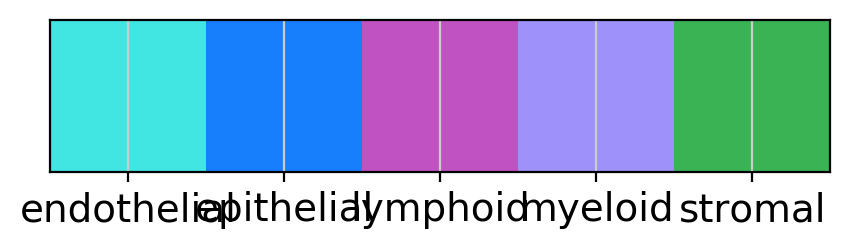

In [1]:
%load_ext autoreload
%autoreload 2

import glob
import os
import sys
from collections import defaultdict

import matplotlib.pyplot as plt
import pandas as pd
import plot_constants

# Handwritten modules
import preprocess
import scanpy as sc
import seaborn as sns
import yaml

# sys.path.append('/home/olga/code/xspecies--olgabot/refactor-bladder-blood-lung-muscle/xspecies/')

## Constants

In [2]:
tissue = "lung"

umap_plot_kws = dict(color=["species", "compartment_group", "broad_group"], ncols=2)
celltype_col = "narrow_group"
species_col = "species"
compartment_col = "compartment_group"

object_dir = (
    "/home/olga/data_lg/data_sm_copy/tabula-microcebus/data-objects/cross-species"
)


output_file = os.path.join(
    object_dir,
    f"concatenated__human-lemur-mouse_10x__one2one_orthologs__{tissue}__preprocessed.h5ad",
)

min_cells_per_celltype = 20

## Set scanpy savefig options

In [3]:
xspecies_figure_folder = "/home/olga/googledrive/TabulaMicrocebus/analysis/cross-species--bladder-blood-lung-muscle"

figure_folder = os.path.join(xspecies_figure_folder, tissue, "preprocess")

sc._settings.ScanpyConfig(autosave=True, figdir=figure_folder, autoshow=True)
# Then, "ALWAYS use sans-serif fonts"
plt.rcParams["font.family"] = "Arial"

sc.settings.autosave = True
sc.settings.autoshow = True
sc.settings.figdir = figure_folder

# Load data

## Unprocessed data

In [4]:
h5ad = os.path.join(
    object_dir,
    f"concatenated__human-lemur-mouse_10x__one2one_orthologs__{tissue}__july2021.h5ad",
)
adata = sc.read(h5ad, cache=True)
print(adata)
# Remove sapiens
adata = adata[adata.obs.species_batch != "human_sapiens"]
adata

AnnData object with n_obs × n_vars = 114218 × 13302
    obs: 'age', 'cell_id', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'n_genes', 'sex', 'subtissue', 'tissue', 'species', 'species_latin', 'channel', 'sequencing_run', 'cell_barcode', 'n_counts', 'individual', 'narrow_group', 'broad_group', 'compartment_group', 'batch', 'channel_10x', 'compartment', 'method', 'species_batch'
    var: 'mouse_lemur__gene_name', 'mouse__gene_name', 'name-lemur', 'highly_variable-lemur', 'n_cells-mouse_tabula_muris_senis'


View of AnnData object with n_obs × n_vars = 114218 × 13302
    obs: 'age', 'cell_id', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'n_genes', 'sex', 'subtissue', 'tissue', 'species', 'species_latin', 'channel', 'sequencing_run', 'cell_barcode', 'n_counts', 'individual', 'narrow_group', 'broad_group', 'compartment_group', 'batch', 'channel_10x', 'compartment', 'method', 'species_batch'
    var: 'mouse_lemur__gene_name', 'mouse__gene_name', 'name-lemur', 'highly_variable-lemur', 'n_cells-mouse_tabula_muris_senis'

In [5]:
sc.pp.calculate_qc_metrics(adata, inplace=True)
adata.obs.head()

Trying to set attribute `.obs` of view, copying.


,age,cell_id,cell_ontology_class,cell_ontology_id,free_annotation,n_genes,sex,subtissue,tissue,species,...,method,species_batch,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes
AAACGGGTCGCCCTTA-1-11-0-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAACGGGTCGCCCTTA,B cell,NA,B,1821.0,female,nan,Lung,Mouse,...,nan,mouse_tabula_muris_senis,1393,7.239933,4309.0,8.368693,41.378510,55.859828,65.026688,79.275934
AAAGATGAGCAGACTG-1-11-0-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAAGATGAGCAGACTG,non-classical monocyte,NA,Nonclassical Monocyte,1333.0,female,nan,Lung,Mouse,...,nan,mouse_tabula_muris_senis,1016,6.924612,2697.0,7.900266,40.266963,50.463478,62.736374,80.867631
AAAGATGAGCCGTCGT-1-11-0-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAAGATGAGCCGTCGT,NK cell,NA,Natural Killer,1455.0,female,nan,Lung,Mouse,...,nan,mouse_tabula_muris_senis,1108,7.011214,2938.0,7.985825,39.380531,52.416610,64.193329,79.305650
AAAGCAACATGGTAGG-1-11-0-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAAGCAACATGGTAGG,alveolar macrophage,NA,Alveolar Macrophage,3322.0,female,nan,Lung,Mouse,...,nan,mouse_tabula_muris_senis,2596,7.862112,9716.0,9.181632,30.825443,41.375051,53.118567,69.092219
AAAGCAAGTCTAGTGT-1-11-0-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAAGCAAGTCTAGTGT,B cell,NA,B,1120.0,female,nan,Lung,Mouse,...,nan,mouse_tabula_muris_senis,876,6.776507,1970.0,7.586296,40.152284,52.081218,63.248731,80.913706


/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


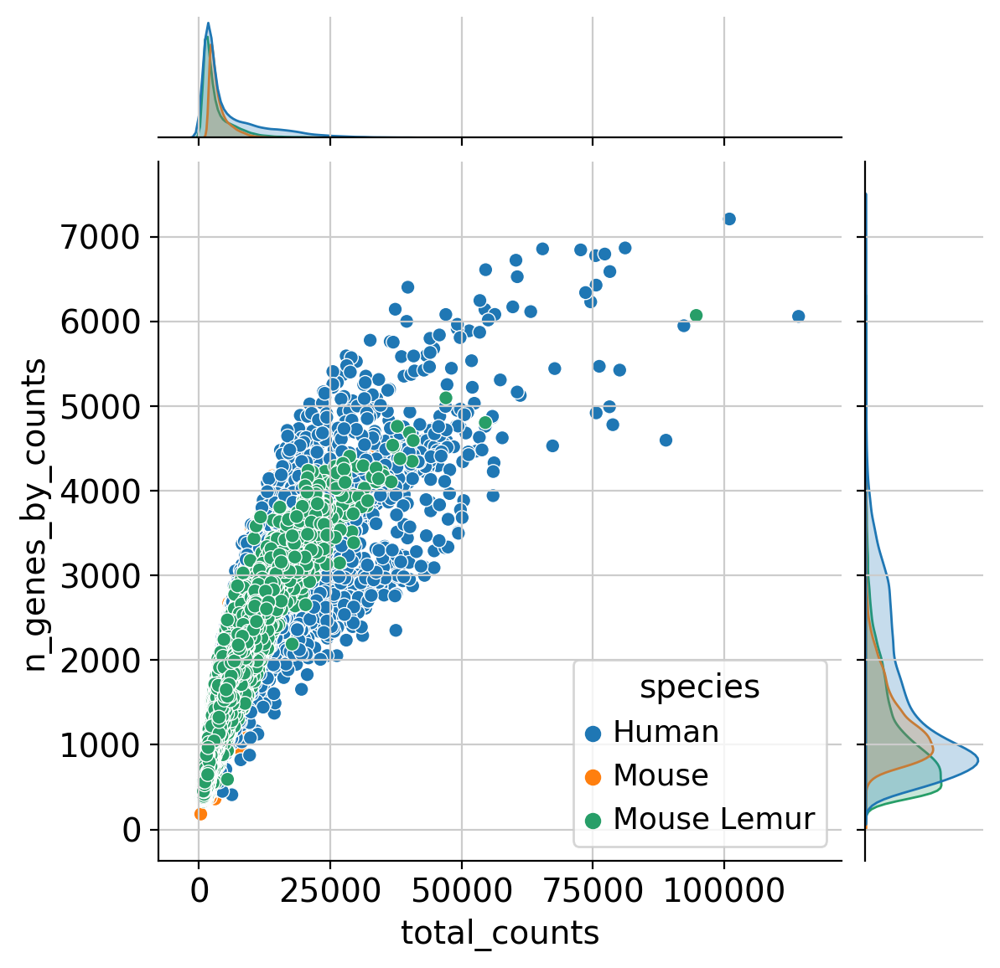

In [6]:
sns.jointplot("total_counts", "n_genes_by_counts", data=adata.obs, hue="species")






In [7]:
adata.obs.groupby(["narrow_group", "species"]).size().unstack()





species,Human,Mouse,Mouse Lemur
narrow_group,,,
B cell,237,1457,241
Regulatory T cell,0,121,0
Schwann cell,0,0,16
T cell (CD4+),2543,534,1264
T cell (CD8+),2068,854,388
T cell (LY6G5B+),0,154,0
adventitial fibroblast,534,517,317
airway associated smooth muscle cell,656,13,0
alveolar epithelial cell type 1,904,0,217


In [8]:
adata.obs.groupby(
    ["compartment_group", "broad_group", "narrow_group", "species"], observed=True
).size().unstack().fillna(0).astype(int)



species                                                                                                Mouse  \
compartment_group       broad_group                            narrow_group                                    
lymphoid                B cell                                 B cell                                   1457   
                        natural killer cell                    natural killer cell                      1141   
                        T cell                                 T cell (CD8+)                             854   
                                                               T cell (LY6G5B+)                          154   
                                                               T cell (CD4+)                             534   
                                                               Regulatory T cell                         121   
                        natural killer T cell                  natural killer T cell                     406   
                        natural killer cell_T cell (PF)        natural killer cell_T cell (PF)           117   
                        plasma cell                            plasma cell                                47   
                        natural killer cell_T cell             natural killer cell_T cell                  0   
                        innate lymphoid cell                   innate lymphoid cell                        0   
myeloid                 monocyte                               monocyte                                 7926   
                                                               monocyte (PF)                            2393   
                                                               proliferating monocyte                      0   
                        macrophage                             alveolar macrophage                      1217   
                                                               alveolar macrophage (PF)                  102   
                                                               interstitial macrophage                  1115   
                        dendritic cell                         conventional dendritic cell               241   
                                                               dendritic cell (PF)                        25   
                                                               plasmacytoid dendritic cell                73   
                                                               dendritic cell (CCR7+ )                    15   
                                                               dendritic cell (IGSF21+)                    0   
                                                               dendritic cell (EREG+)                      0   
                                                               dendritic cell (TREM2+)                     0   
                                                               dendritic cell (FLT3+ IGSF6+)               0   
                                                               mature dendritic cell                       0   
                        neutrophil                             neutrophil                                543   
                                                               proliferating neutrophil                    0   
                        basophil                               basophil                                  128   
                        eosinophil                             eosinophil                                  0   
                        granulocyte monocyte progenitor cell   granulocyte monocyte progenitor cell        0   
endothelial             capillary cell                         capillary cell                           1743   
                                                               capillary aerocyte cell                   512   
                                                               capillary interme

In [9]:
1 + 1


2

## Ignore Fibromyocytes and myofibroblasts

Hard to tell between them in lemur, so ignore

In [10]:
celltypes_to_ignore = "fibromyocyte", "myofibroblast cell", "myofibroblast"




In [11]:
adata = adata[~adata.obs.narrow_group.isin(celltypes_to_ignore)]
adata

View of AnnData object with n_obs × n_vars = 113635 × 13302
    obs: 'age', 'cell_id', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'n_genes', 'sex', 'subtissue', 'tissue', 'species', 'species_latin', 'channel', 'sequencing_run', 'cell_barcode', 'n_counts', 'individual', 'narrow_group', 'broad_group', 'compartment_group', 'batch', 'channel_10x', 'compartment', 'method', 'species_batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'mouse_lemur__gene_name', 'mouse__gene_name', 'name-lemur', 'highly_variable-lemur', 'n_cells-mouse_tabula_muris_senis', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [12]:
adata.obs.groupby(["narrow_group", "species"]).size().unstack()

species,Human,Mouse,Mouse Lemur
narrow_group,,,
B cell,237,1457,241
Regulatory T cell,0,121,0
Schwann cell,0,0,16
T cell (CD4+),2543,534,1264
T cell (CD8+),2068,854,388
T cell (LY6G5B+),0,154,0
adventitial fibroblast,534,517,317
airway associated smooth muscle cell,656,13,0
alveolar epithelial cell type 1,904,0,217


In [13]:
preprocess.remove_color_palettes(adata)

In [14]:
preprocess.plot_constants.SPECIES_PALETTE

['#ff7f0e', '#2ca02c', '#1f77b4']

In [15]:
adata.uns["species_colors"] = preprocess.plot_constants.SPECIES_PALETTE

Trying to set attribute `.uns` of view, copying.


... storing 'compartment_broad' as categorical
... storing 'compartment_narrow' as categorical
... storing 'compartment_broad_narrow' as categorical
... storing 'compartment_species' as categorical
... storing 'compartment_narrow_species' as categorical


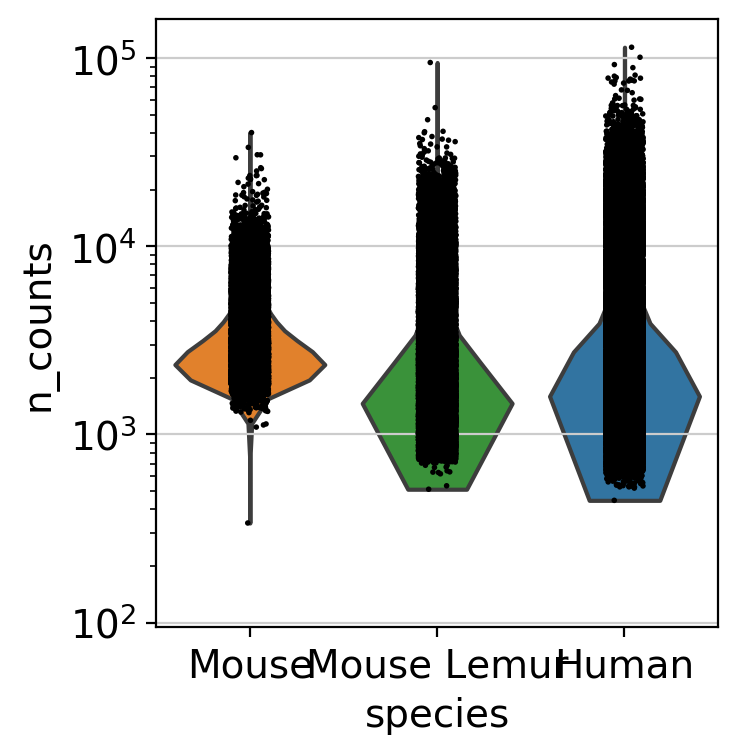

<Figure size 800x800 with 0 Axes>

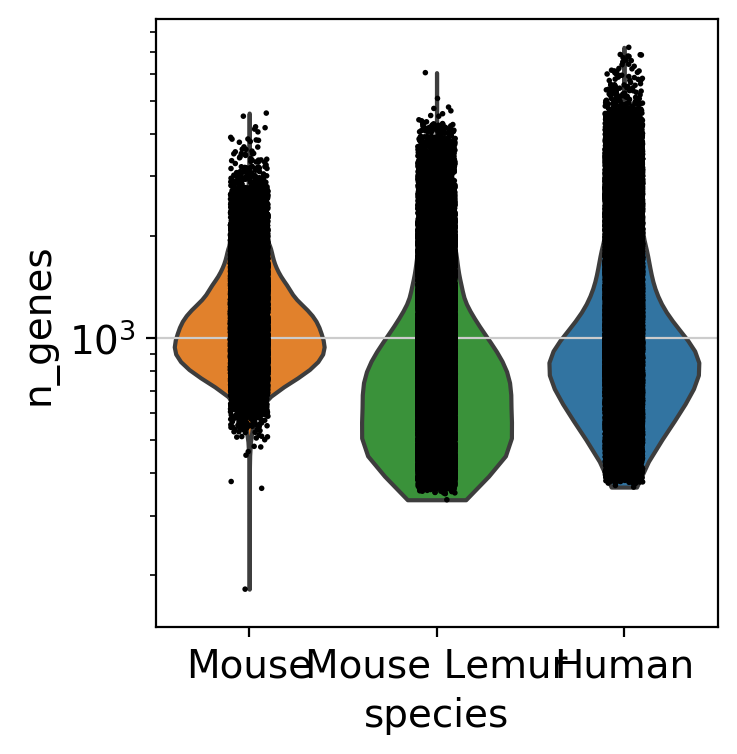

<Figure size 800x800 with 0 Axes>

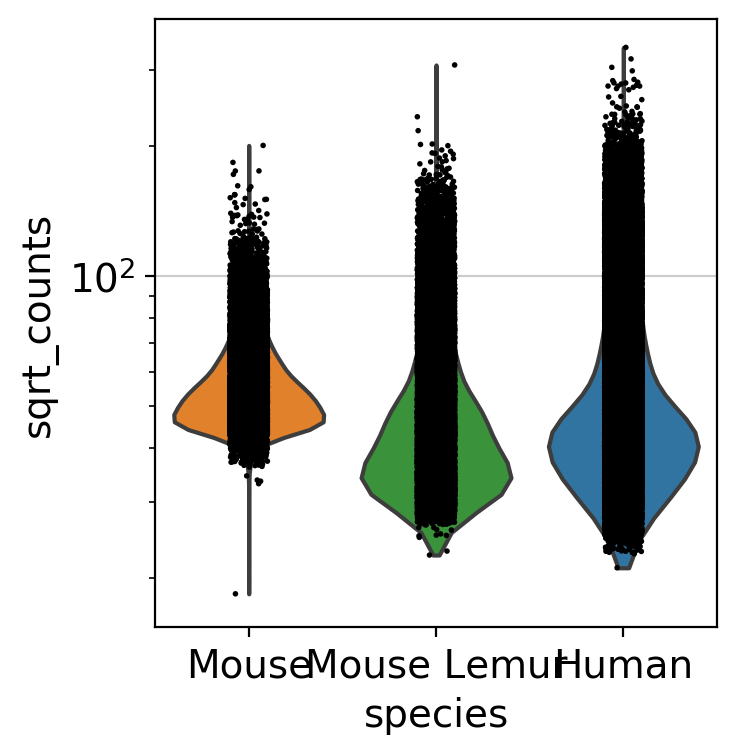

<Figure size 800x800 with 0 Axes>

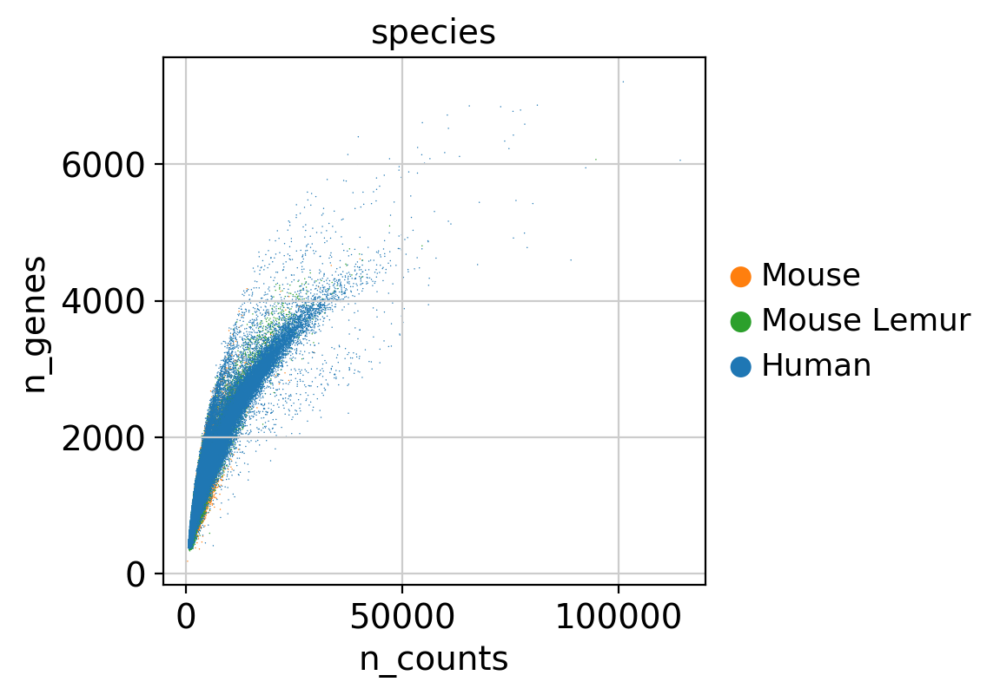

<Figure size 800x800 with 0 Axes>

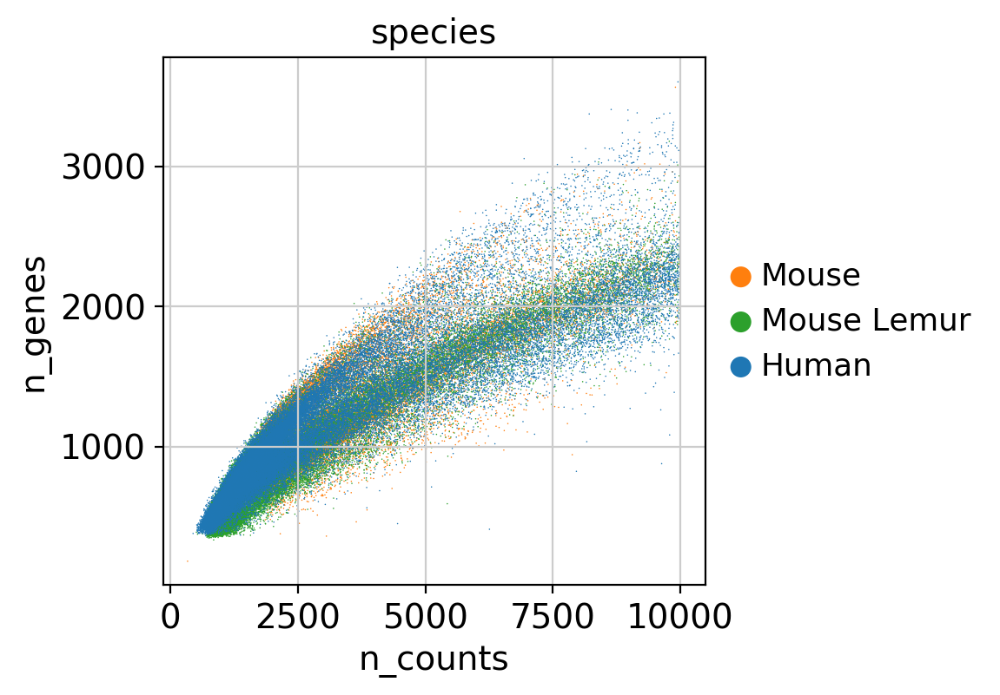

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 800x800 with 0 Axes>

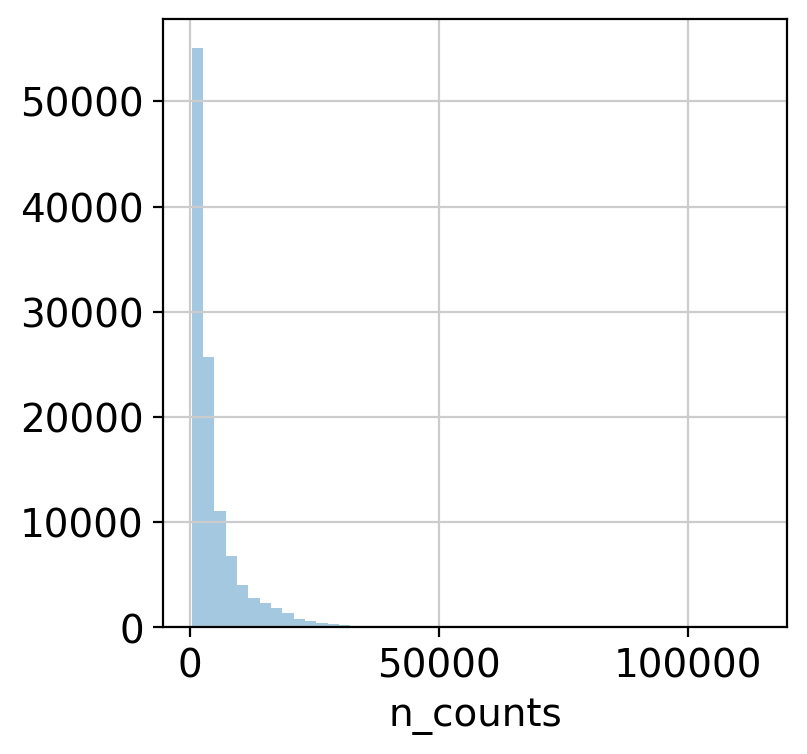

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


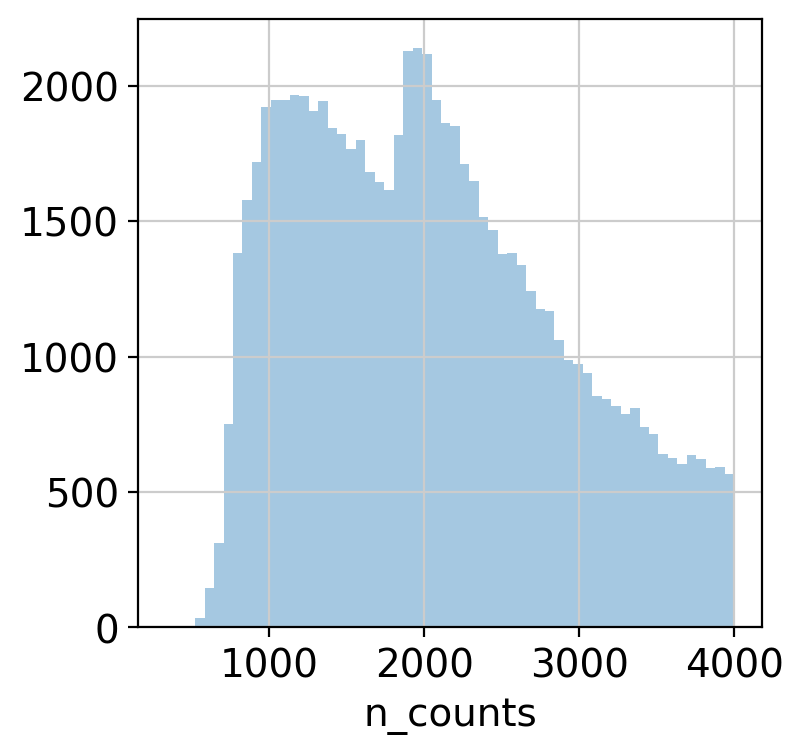

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


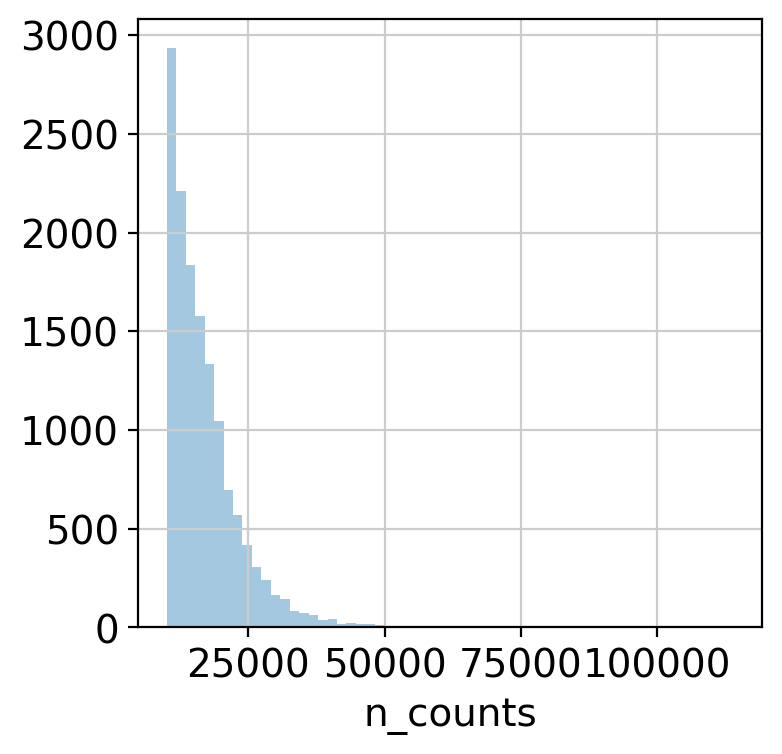

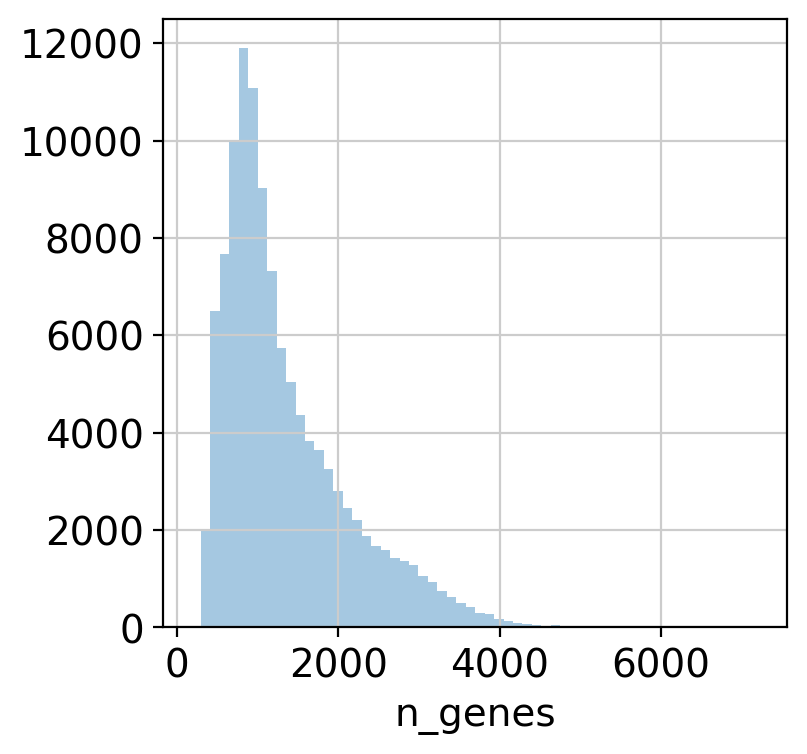

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


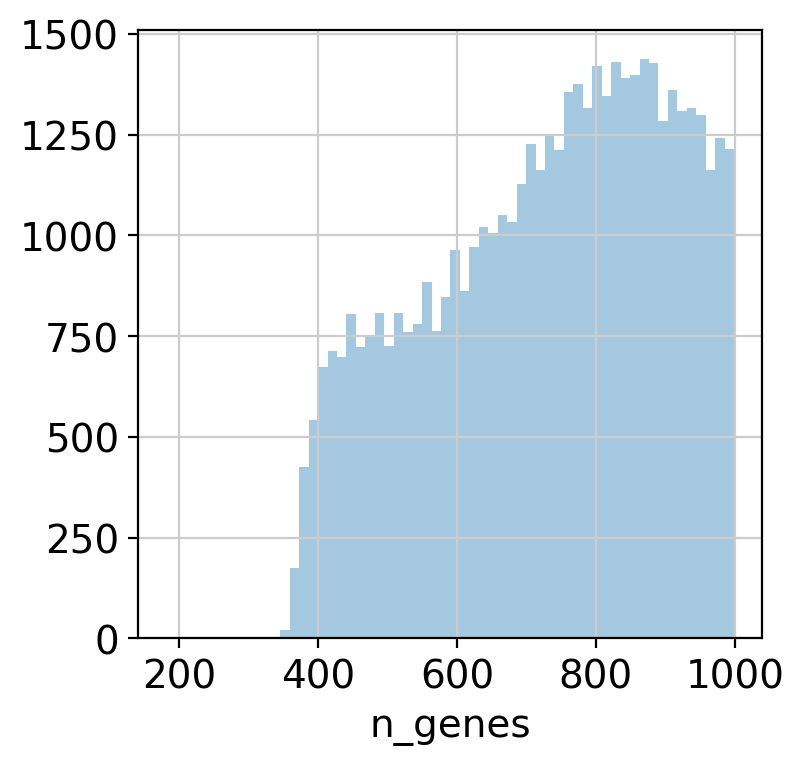

filtered out 7529 cells that have less than 1000 counts


Total number of cells: 113635
Number of cells after min count filter: 106106
Number of cells after gene filter: 106106
Total number of genes: 13302


filtered out 246 genes that are detected in less than 3 cells
normalizing counts per cell


Number of genes after cell filter: 13056


    finished (0:00:00)


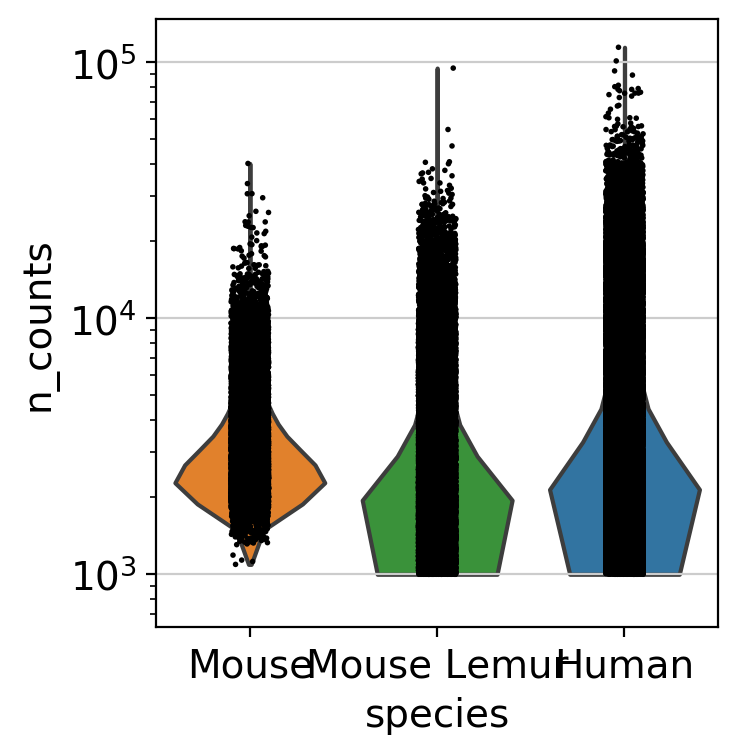

<Figure size 800x800 with 0 Axes>

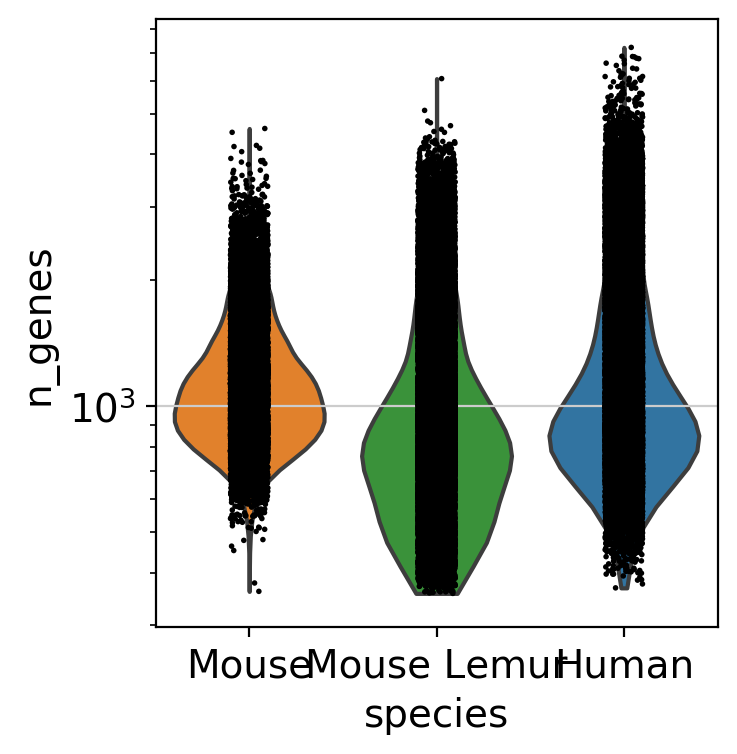

<Figure size 800x800 with 0 Axes>

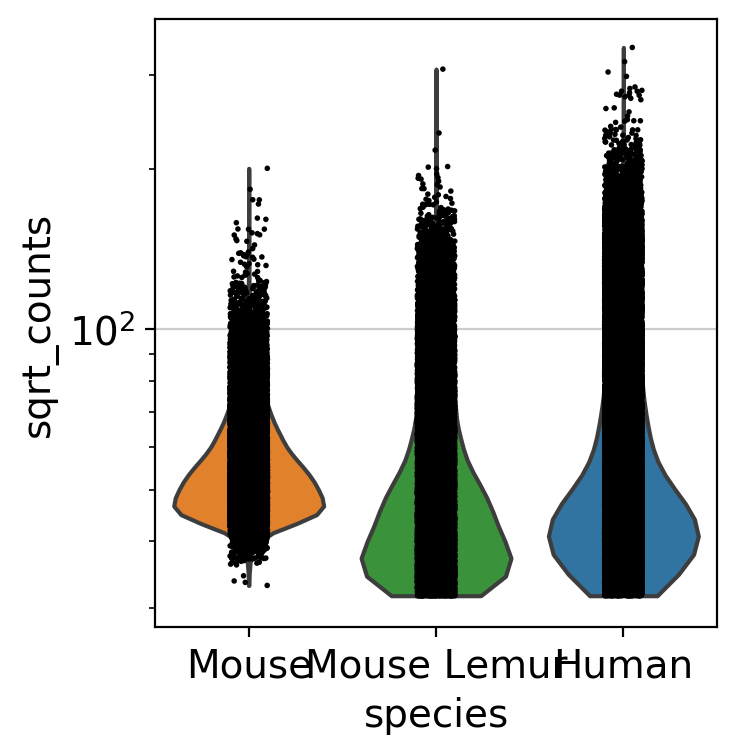

<Figure size 800x800 with 0 Axes>

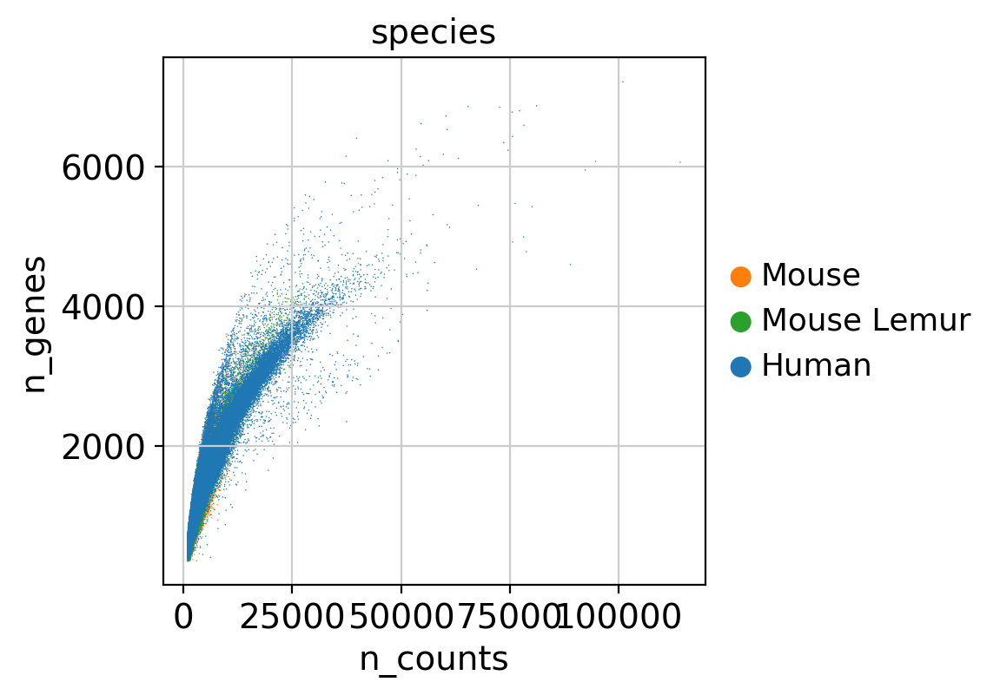

<Figure size 800x800 with 0 Axes>

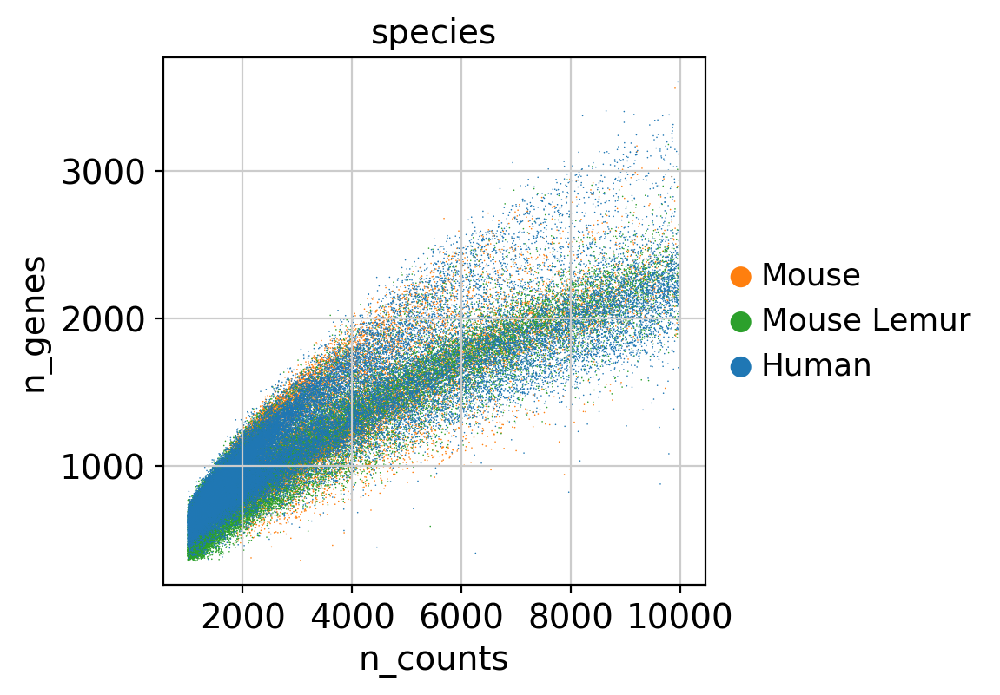

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 800x800 with 0 Axes>

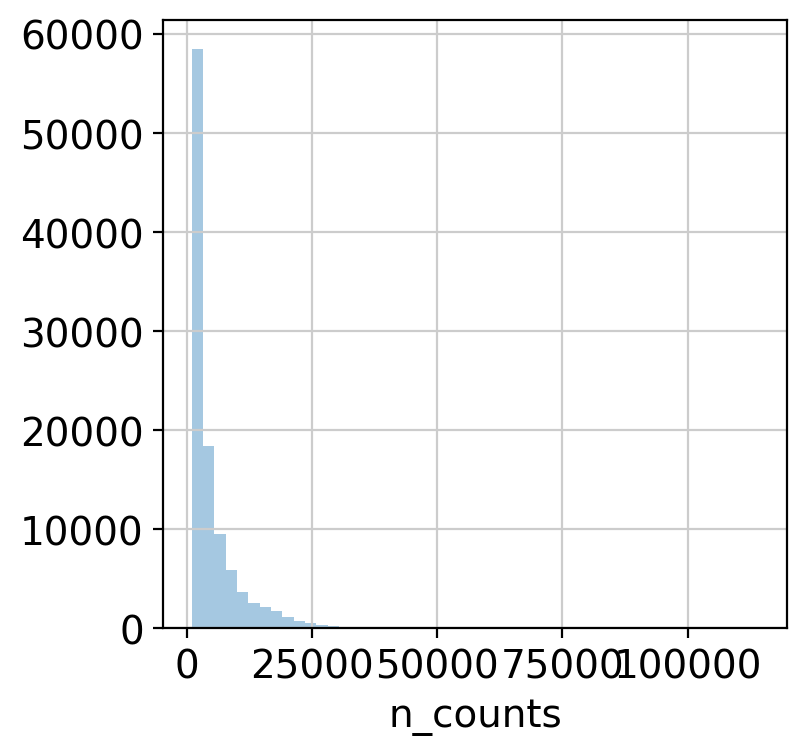

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


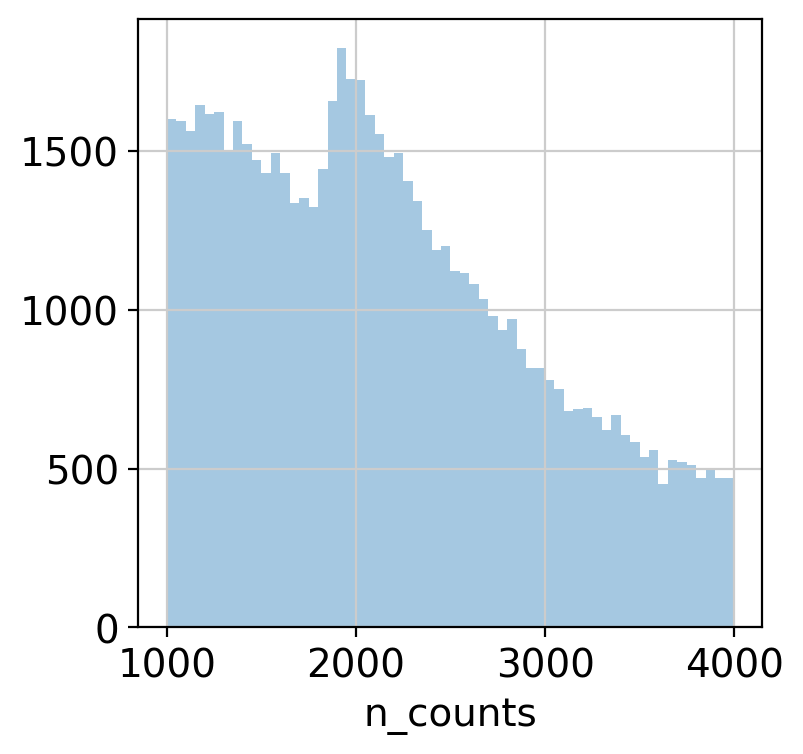

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


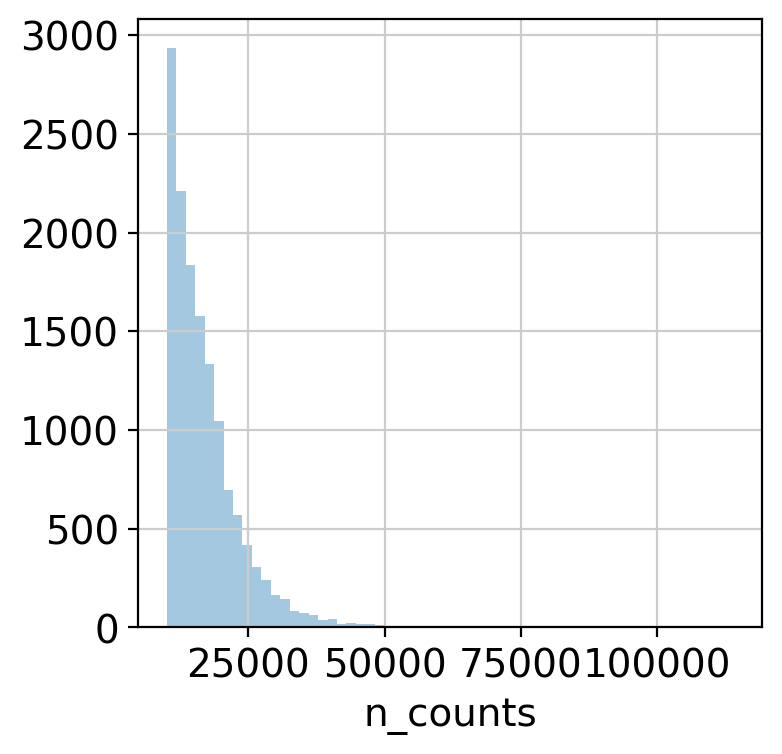

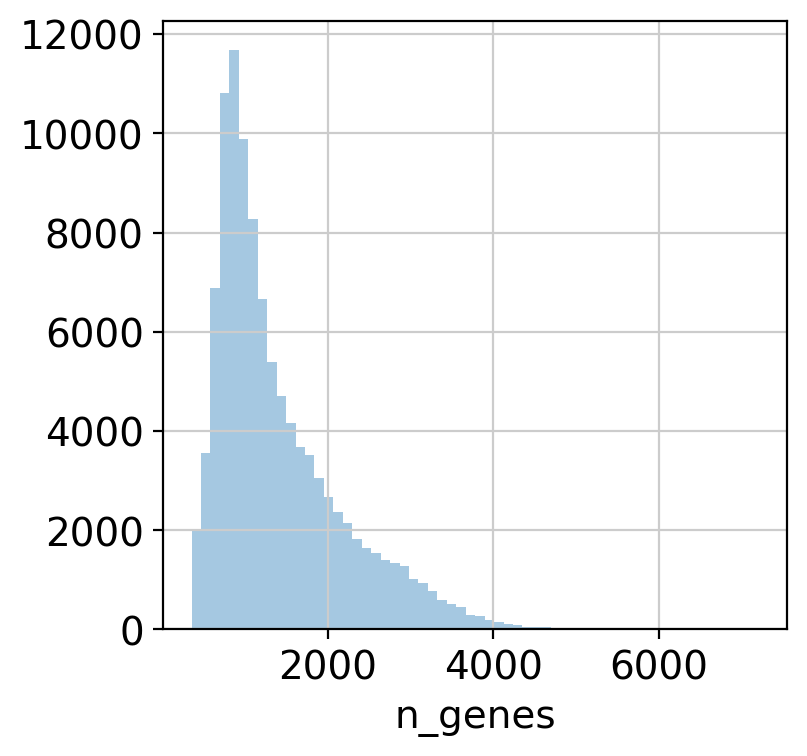

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


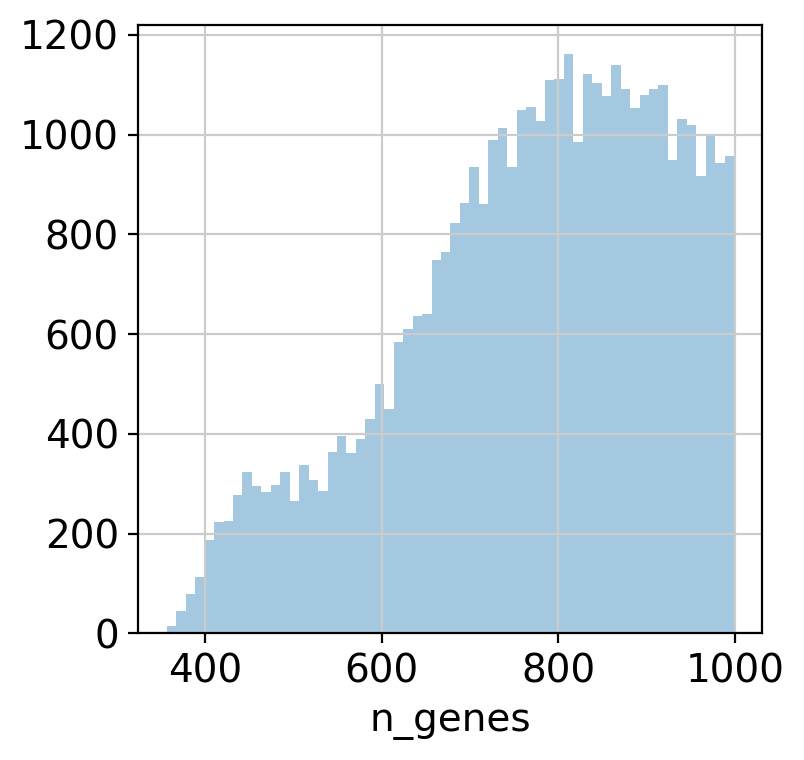

In [16]:
adata = preprocess.add_compartment_combined_cols(adata)
adata = preprocess.filter_genes_cells(adata)

## Do PCA + k-nearest neighbors pre-subsetting to only shared celltypes

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50



 Number of highly variable genes: 3558


    finished (0:00:16)
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


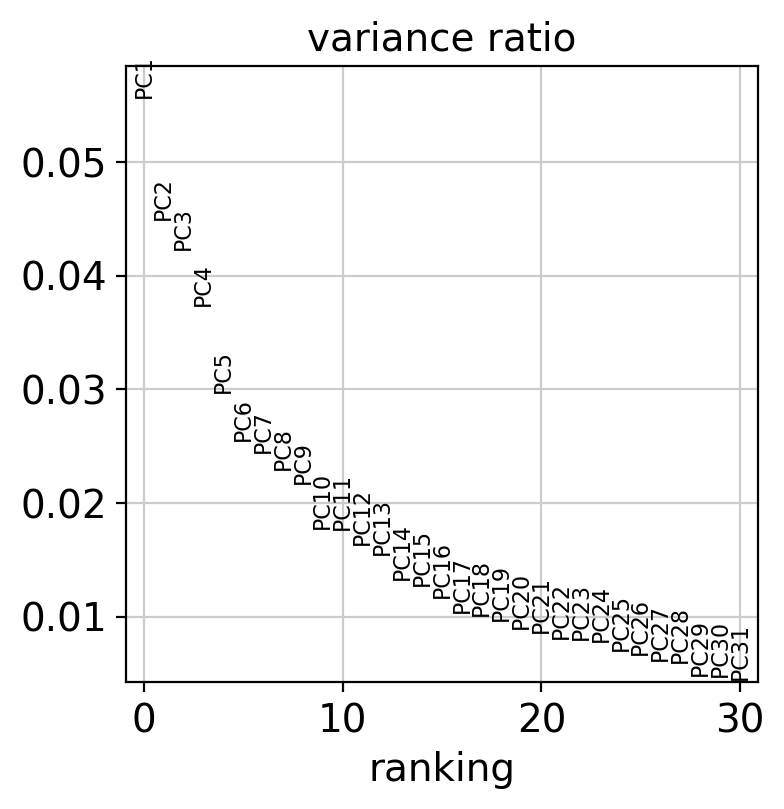

<Figure size 800x800 with 0 Axes>

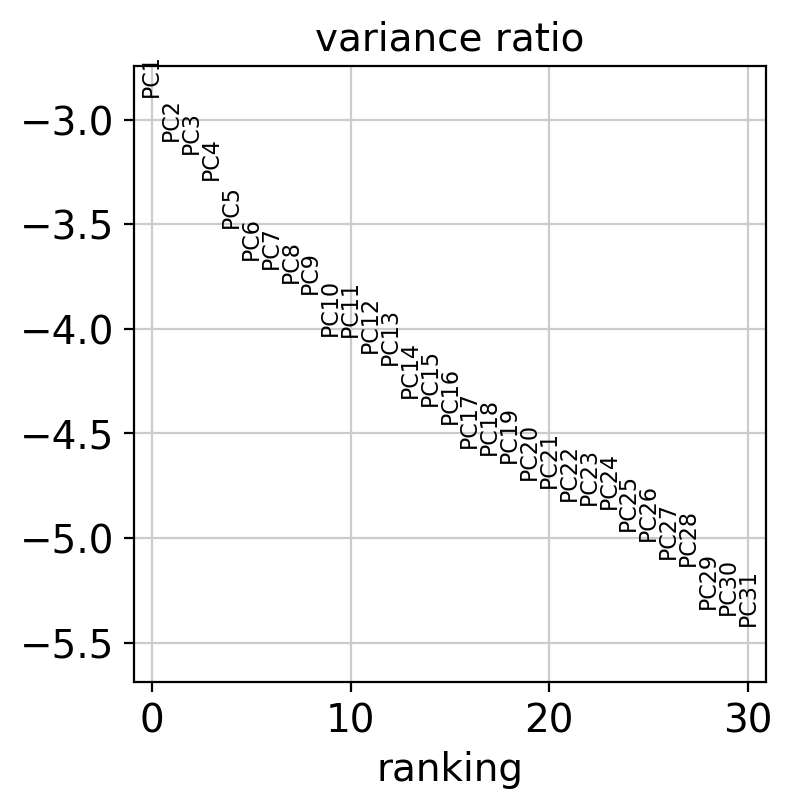

computing PCA
    on highly variable genes
    with n_comps=40
    finished (0:00:14)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:36)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:22)


<Figure size 800x800 with 0 Axes>

In [17]:
adata = preprocess.dimensionality_reduction(adata)
# Pre-BBKNN UMAPs

In [18]:
preprocess.remove_color_palettes(adata)

removing 'species_colors'


### Plot sftpc


# Plot shared cell types

In [19]:
min_cells_per_celltype

20

In [20]:
adata = preprocess.filter_min_cells_per_group(
    adata,
    celltype_col=celltype_col,
    species_col=species_col,
    min_cells_per_celltype=min_cells_per_celltype,
)

Filtering for celltype column narrow_group with at least 20 cells per species
--- Before filtering ---
-- Number of cell types: 70 --
narrow_group                            species    
B cell                                  Mouse           1457
                                        Mouse Lemur      208
                                        Human            230
Regulatory T cell                       Mouse            121
                                        Mouse Lemur        0
                                        Human              0
Schwann cell                            Mouse              0
                                        Mouse Lemur        5
                                        Human              0
T cell (CD4+)                           Mouse            534
                                        Mouse Lemur     1029
                                        Human           2297
T cell (CD8+)                           Mouse            854
                     

In [21]:
adata.obs.groupby(["narrow_group", "species"]).size().unstack()

species,Mouse,Mouse Lemur,Human
narrow_group,,,
B cell,1457,208,230
T cell (CD4+),534,1029,2297
T cell (CD8+),854,347,1942
adventitial fibroblast,517,310,527
alveolar epithelial cell type 2,122,948,4185
alveolar fibroblast,1499,918,1048
alveolar macrophage,1217,3704,13737
alveolar macrophage (PF),102,911,210
artery cell,95,78,1306


## Plot shared cell types

In [22]:
from plot_utils import save_figures

(66, 4)
--- compartment: endothelial ---


/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:64: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(*args, **kwargs)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:49: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(**kwargs)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:64: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(*args, **kwargs)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:49: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  a

--- compartment: epithelial ---
--- compartment: lymphoid ---


/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:64: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(*args, **kwargs)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:49: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(**kwargs)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:64: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(*args, **kwargs)


--- compartment: myeloid ---


/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:49: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(**kwargs)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:64: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(*args, **kwargs)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:49: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(**kwargs)


--- compartment: stromal ---


Saving figures: 100%|██████████| 5/5 [00:27<00:00,  5.42s/it]


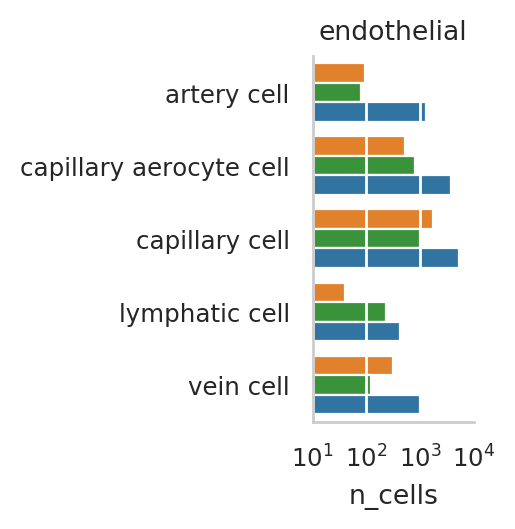

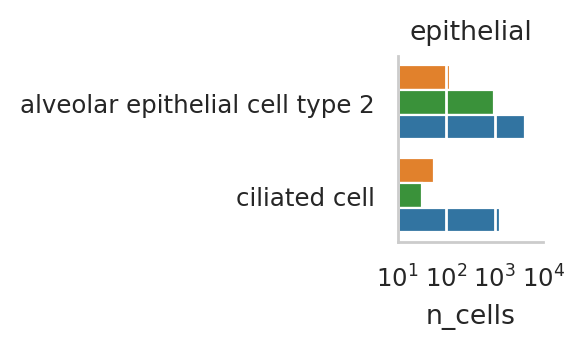

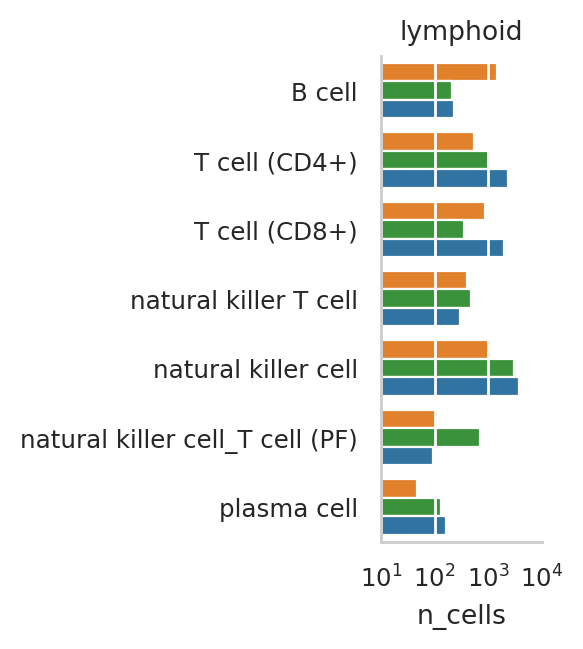

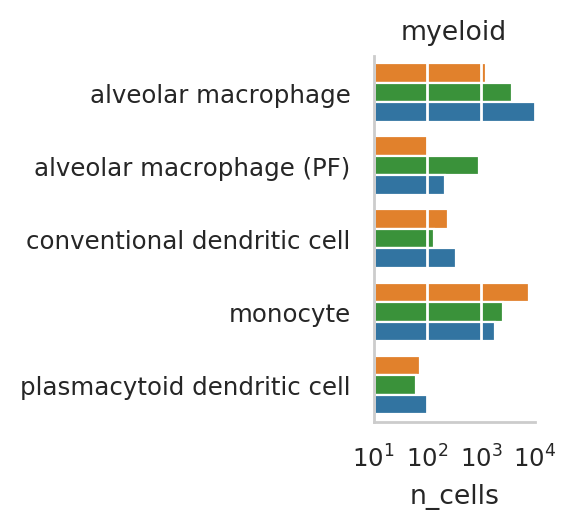

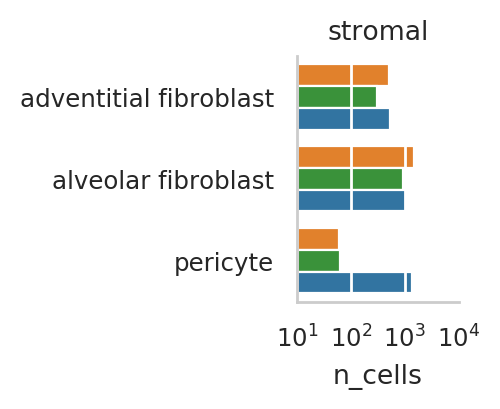

In [23]:
preprocess.plot_shared_cell_types(adata, celltype_col, compartment_col, species_col)
save_figures(os.path.join(figure_folder, "shared_cell_types"))

# Dimensionality reduction

## Do PCA + k-nearest neighbors pre-batch correction with BBKNN

extracting highly variable genes
    finished (0:00:01)
Trying to set attribute `.uns` of view, copying.
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50



 Number of highly variable genes: 3474


    finished (0:00:12)


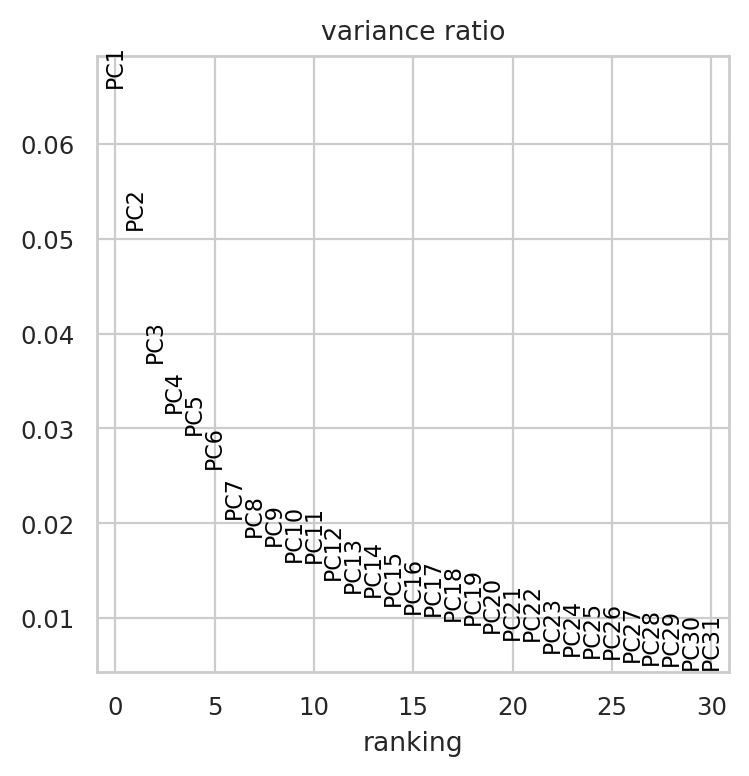

<Figure size 800x800 with 0 Axes>

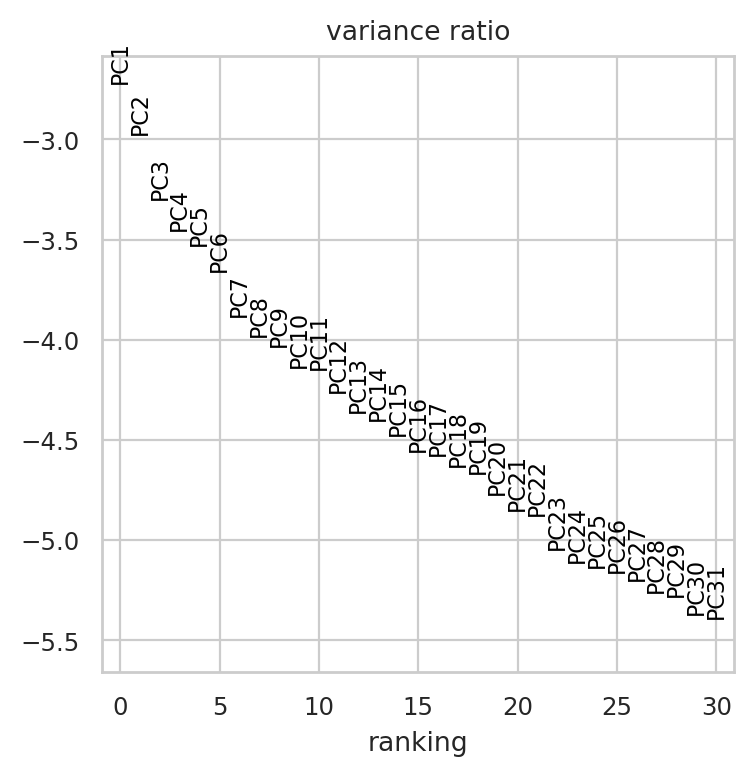

computing PCA
    on highly variable genes
    with n_comps=40
    finished (0:00:10)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:55)


<Figure size 800x800 with 0 Axes>

In [24]:
adata = preprocess.dimensionality_reduction(adata)
# Pre-BBKNN UMAPs

In [25]:
preprocess.remove_color_palettes(adata)

Error plotting with colors=['species', 'species_batch', 'age', 'individual'], skipping


<Figure size 3864x800 with 0 Axes>

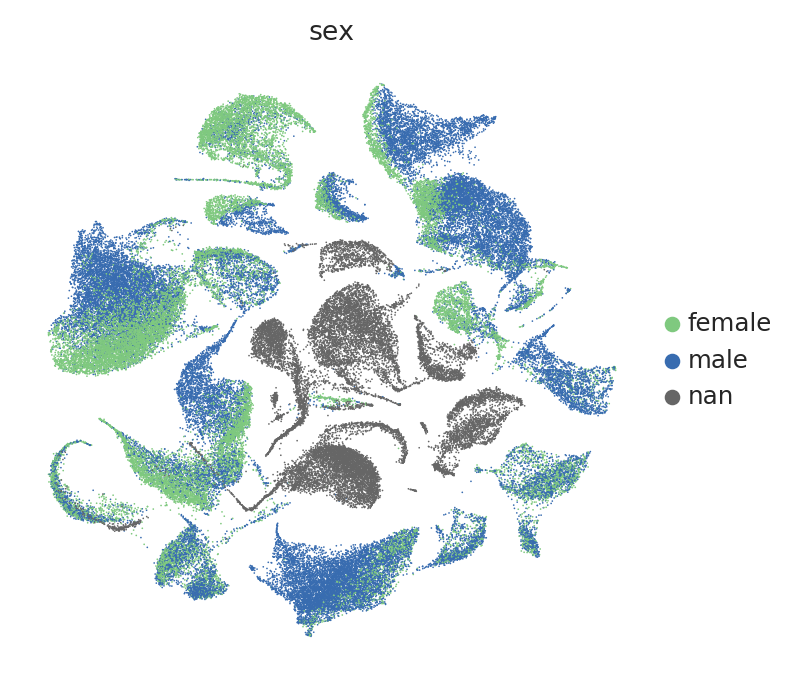

<Figure size 800x800 with 0 Axes>

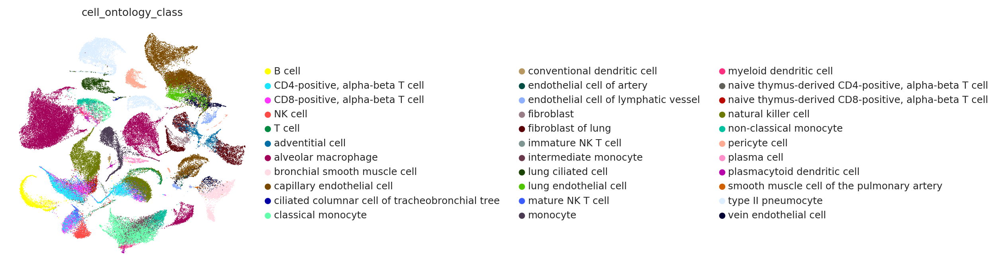

<Figure size 800x800 with 0 Axes>

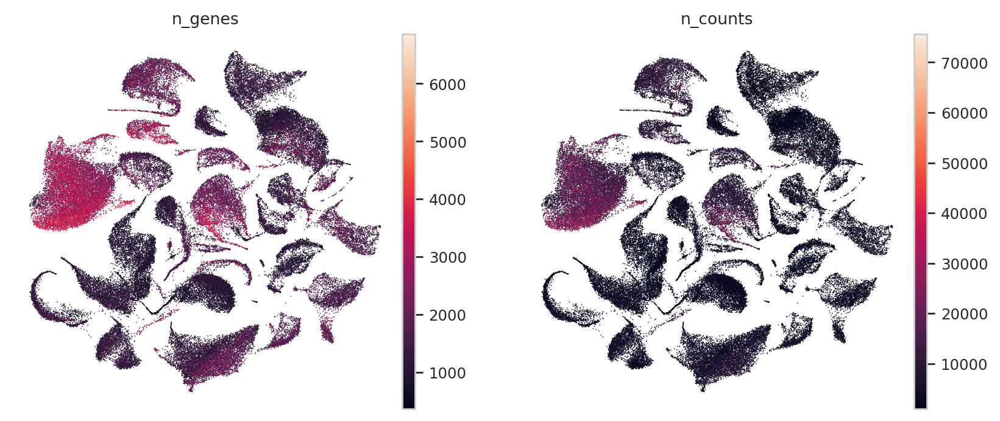

<Figure size 800x800 with 0 Axes>

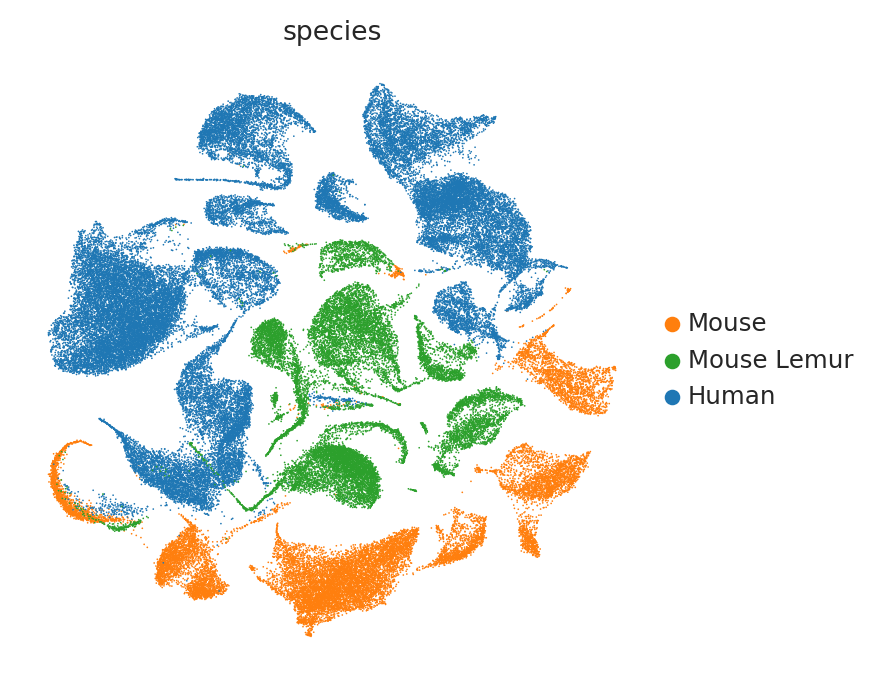

<Figure size 800x800 with 0 Axes>

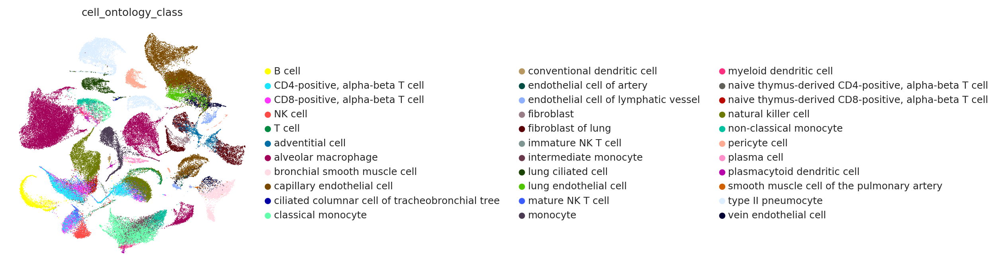

Error plotting with colors=['narrow_group', 'broad_group', 'compartment_group'], skipping


<Figure size 800x800 with 0 Axes>

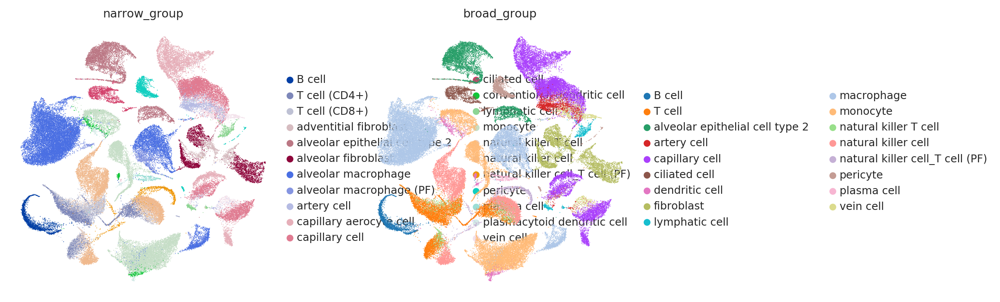

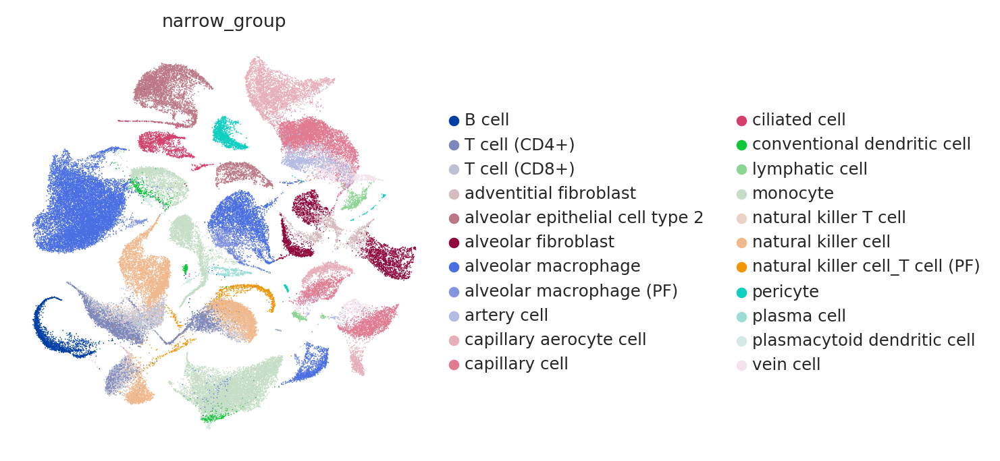

<Figure size 800x800 with 0 Axes>

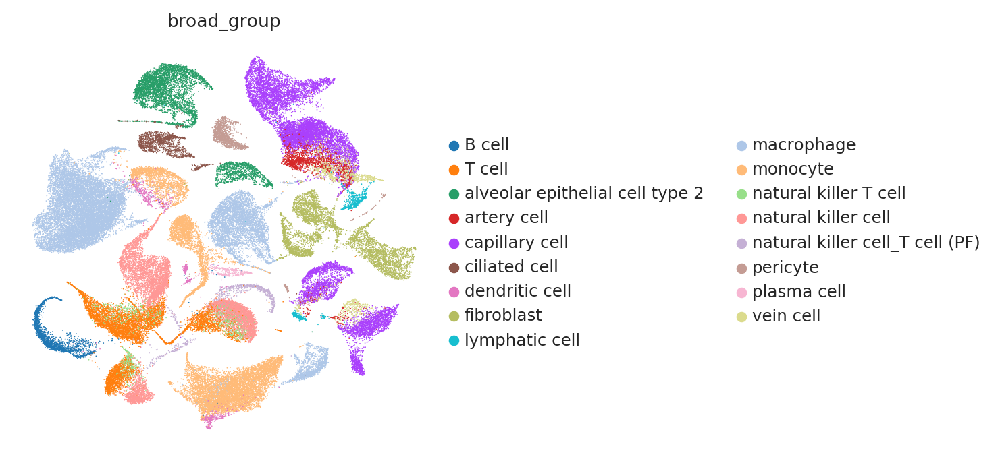

<Figure size 800x800 with 0 Axes>

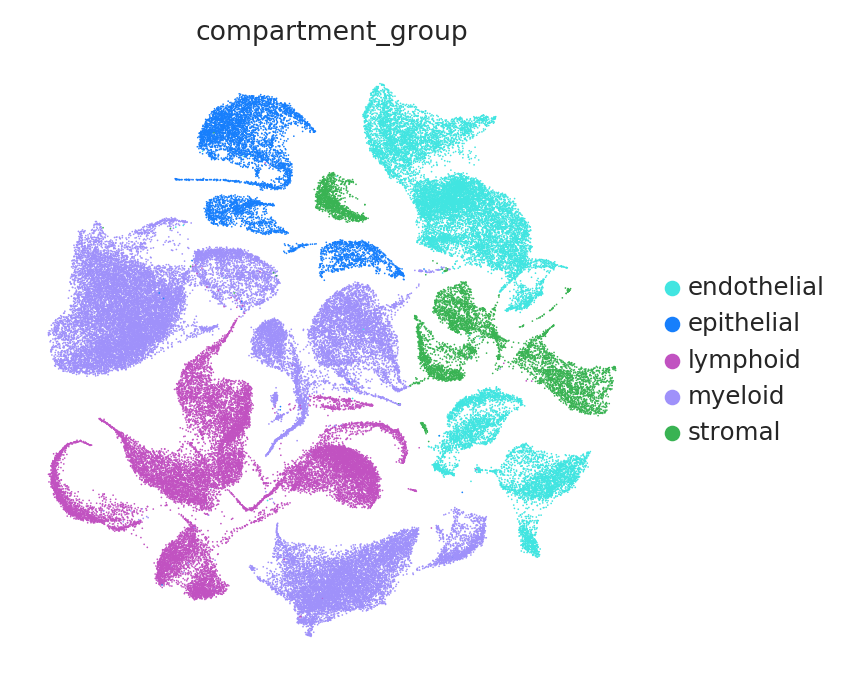

<Figure size 800x800 with 0 Axes>

In [26]:
preprocess.plot_umaps(adata)

## Do BBKNN, draw new umaps

In [27]:
preprocess.run_bbknn(adata)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:57)


In [28]:
# Post-BBKNN UMAPs
# preprocess.plot_umaps(adata)

In [29]:
preprocess.remove_color_palettes(adata)

removing 'species_colors'
removing 'sex_colors'
removing 'cell_ontology_class_colors'
removing 'narrow_group_colors'
removing 'broad_group_colors'
removing 'compartment_group_colors'


### Species

In [30]:
preprocess.remove_color_palettes(adata)

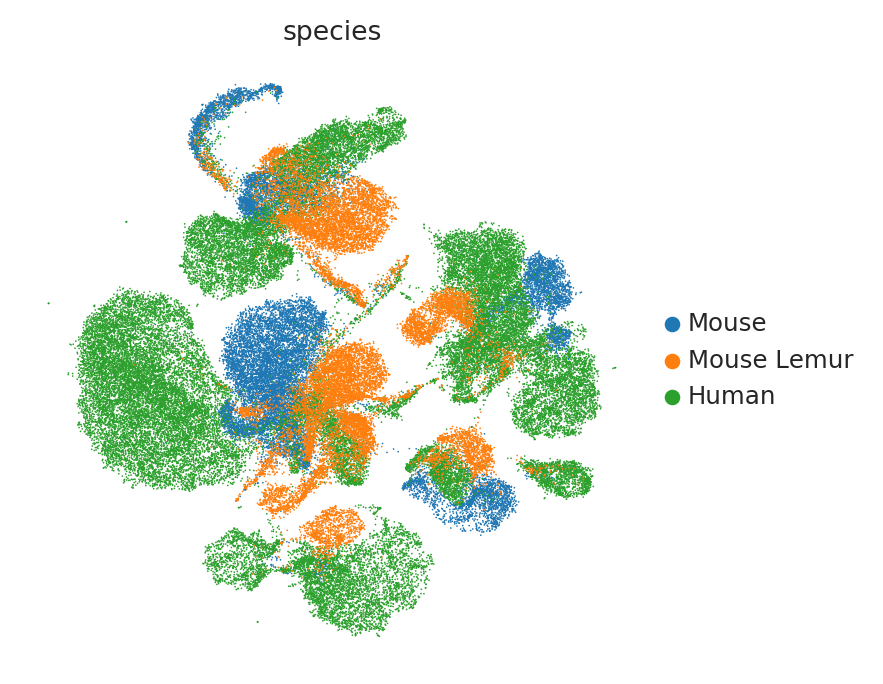

In [31]:
# there is some bug when the palette is pre-set
try:
    del adata.uns["species_colors"]
except KeyError:
    pass

tab10 = sns.color_palette("tab10")

sc.pl.umap(adata, color="species", palette=tab10[:3], save="__species")

### Species batch

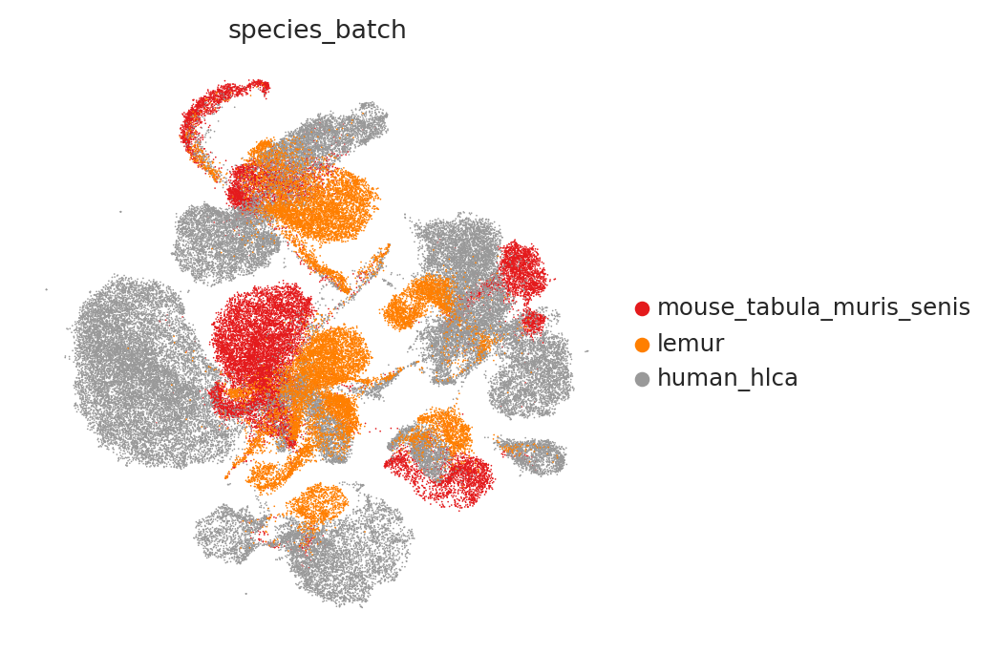

In [32]:
sc.pl.umap(adata, color="species_batch", palette="Set1", save="__species_batch")

### Narrow group

## Match the cell type colors to the paper

In [33]:
metadata = pd.read_csv(
    "/home/olga/googledrive/TabulaMicrocebus/data/h5ad-objs/ss2-10x-combined/LCA_SS2_10x_metadata_v1_wColor_wOrder.csv",
    index_col=0,
)
print(metadata.shape)
metadata.head()

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3051: DtypeWarning: Columns (8,12,34,35) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(244081, 41)


,nCount_RNA,nFeature_RNA,cell_name,cell_barcode_10x,sequencing_run_10x,channel_10x,batch_SS2,possibly_contaminated_barcode_10x,method,individual,...,dendrogram_annotation_order,mix_hybrid,low_quality,asterix,dendrogram_subgroup_color_hex,dendrogram_subgroup_color_R,dendrogram_subgroup_color_G,dendrogram_subgroup_color_B,order__compartment_freeannotation_tissue,order__tissue_compartment_freeannotation
MAA001519_B108948_A10_S10,2467361,2526,MAA001519_B108948_A10_S10,NaN,NaN,NaN,0,NaN,smartseq2,Antoine,...,274.0,NaN,NaN,NaN,ffdcb8,255.0,220.0,184.0,767.0,767.0
MAA001519_B108948_A11_S11,2489227,2764,MAA001519_B108948_A11_S11,NaN,NaN,NaN,0,NaN,smartseq2,Antoine,...,274.0,NaN,NaN,NaN,ffdcb8,255.0,220.0,184.0,767.0,767.0
MAA001519_B108948_A12_S12,2267728,7156,MAA001519_B108948_A12_S12,NaN,NaN,NaN,0,NaN,smartseq2,Antoine,...,271.0,NaN,NaN,NaN,ffb870,255.0,184.0,112.0,764.0,764.0
MAA001519_B108948_A13_S13,1663223,3401,MAA001519_B108948_A13_S13,NaN,NaN,NaN,0,NaN,smartseq2,Antoine,...,274.0,NaN,NaN,NaN,ffdcb8,255.0,220.0,184.0,767.0,767.0
MAA001519_B108948_A14_S14,1410159,8500,MAA001519_B108948_A14_S14,NaN,NaN,NaN,0,NaN,smartseq2,Antoine,...,271.0,NaN,NaN,NaN,ffb870,255.0,184.0,112.0,764.0,764.0


In [34]:
metadata_colors = metadata[
    [
        x
        for x in metadata.columns
        if ("dendrogram" in x or "color" in x) and ("name" in x or "hex" in x)
    ]
]
hex_cols = [x for x in metadata_colors.columns if "hex" in x]
metadata_colors[hex_cols] = "#" + metadata_colors[hex_cols]
metadata_colors.head()

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/pandas/core/frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


,dendrogram_group_name,dendrogram_group_color_name,dendrogram_group_color_hex,dendrogram_subgroup_name,dendrogram_subgroup_color_hex
MAA001519_B108948_A10_S10,germ,orange,#ff8911,spermatid,#ffdcb8
MAA001519_B108948_A11_S11,germ,orange,#ff8911,spermatid,#ffdcb8
MAA001519_B108948_A12_S12,germ,orange,#ff8911,spermatocyte,#ffb870
MAA001519_B108948_A13_S13,germ,orange,#ff8911,spermatid,#ffdcb8
MAA001519_B108948_A14_S14,germ,orange,#ff8911,spermatocyte,#ffb870


In [35]:
adata.obs.head()

,age,cell_id,cell_ontology_class,cell_ontology_id,free_annotation,n_genes,sex,subtissue,tissue,species,...,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,compartment_broad,compartment_narrow,compartment_broad_narrow,compartment_species,compartment_narrow_species,log_counts,sqrt_counts
AAACGGGTCGCCCTTA-1-11-0-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAACGGGTCGCCCTTA,B cell,NA,B,1393,female,nan,Lung,Mouse,...,55.859828,65.026688,79.275934,lymphoid: B cell,lymphoid: B cell,lymphoid: B cell: B cell,lymphoid: Mouse,lymphoid: B cell: Mouse,8.368693,65.642975
AAAGATGAGCAGACTG-1-11-0-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAAGATGAGCAGACTG,non-classical monocyte,NA,Nonclassical Monocyte,1016,female,nan,Lung,Mouse,...,50.463478,62.736374,80.867631,myeloid: monocyte,myeloid: monocyte,myeloid: monocyte: monocyte,myeloid: Mouse,myeloid: monocyte: Mouse,7.900266,51.932648
AAAGATGAGCCGTCGT-1-11-0-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAAGATGAGCCGTCGT,NK cell,NA,Natural Killer,1108,female,nan,Lung,Mouse,...,52.416610,64.193329,79.305650,lymphoid: natural killer cell,lymphoid: natural killer cell,lymphoid: natural killer cell: natural killer ...,lymphoid: Mouse,lymphoid: natural killer cell: Mouse,7.985825,54.203320
AAAGCAACATGGTAGG-1-11-0-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAAGCAACATGGTAGG,alveolar macrophage,NA,Alveolar Macrophage,2596,female,nan,Lung,Mouse,...,41.375051,53.118567,69.092219,myeloid: macrophage,myeloid: alveolar macrophage,myeloid: macrophage: alveolar macrophage,myeloid: Mouse,myeloid: alveolar macrophage: Mouse,9.181633,98.569771
AAAGCAAGTCTAGTGT-1-11-0-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAAGCAAGTCTAGTGT,B cell,NA,B,876,female,nan,Lung,Mouse,...,52.081218,63.248731,80.913706,lymphoid: B cell,lymphoid: B cell,lymphoid: B cell: B cell,lymphoid: Mouse,lymphoid: B cell: Mouse,7.586297,44.384682


In [38]:
lemur_obs = adata.obs.query('species == "Mouse Lemur"')
lemur_obs.head()

,age,cell_id,cell_ontology_class,cell_ontology_id,free_annotation,n_genes,sex,subtissue,tissue,species,...,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,compartment_broad,compartment_narrow,compartment_broad_narrow,compartment_species,compartment_narrow_species,log_counts,sqrt_counts
L3_Lung_10X_AAACCTGAGAGAGCTC-lemur,nan,nan,monocyte,nan,monocyte,1343,nan,nan,Lung,Mouse Lemur,...,50.885961,64.856883,80.849614,myeloid: monocyte,myeloid: monocyte,myeloid: monocyte: monocyte,myeloid: Mouse Lemur,myeloid: monocyte: Mouse Lemur,8.390041,66.347572
L3_Lung_10X_AAACCTGCACCAGATT-lemur,nan,nan,capillary endothelial cell,nan,capillary cell (FABP5- RBP7-),1309,nan,nan,Lung,Mouse Lemur,...,41.062802,53.071084,72.084196,endothelial: capillary cell,endothelial: capillary cell,endothelial: capillary cell: capillary cell,endothelial: Mouse Lemur,endothelial: capillary cell: Mouse Lemur,7.972121,53.833076
L3_Lung_10X_AAACCTGCAGCCAGAA-lemur,nan,nan,alveolar macrophage,nan,alveolar macrophage,2345,nan,nan,Lung,Mouse Lemur,...,42.407064,55.859588,71.917584,myeloid: macrophage,myeloid: alveolar macrophage,myeloid: macrophage: alveolar macrophage,myeloid: Mouse Lemur,myeloid: alveolar macrophage: Mouse Lemur,9.124129,95.775780
L3_Lung_10X_AAACCTGCAGTATGCT-lemur,nan,nan,monocyte,nan,monocyte,1305,nan,nan,Lung,Mouse Lemur,...,52.051093,63.817244,80.225989,myeloid: monocyte,myeloid: monocyte,myeloid: monocyte: monocyte,myeloid: Mouse Lemur,myeloid: monocyte: Mouse Lemur,8.311890,63.804390
L3_Lung_10X_AAACCTGGTGCTAGCC-lemur,nan,nan,alveolar macrophage,nan,alveolar macrophage (PF),3569,nan,nan,Lung,Mouse Lemur,...,42.452193,54.645669,68.807649,myeloid: macrophage,myeloid: alveolar macrophage (PF),myeloid: macrophage: alveolar macrophage (PF),myeloid: Mouse Lemur,myeloid: alveolar macrophage (PF): Mouse Lemur,9.785886,133.341660


In [45]:
lemur_obs.channel_10x

L3_Lung_10X_AAACCTGAGAGAGCTC-lemur            L3_Lung_10X
L3_Lung_10X_AAACCTGCACCAGATT-lemur            L3_Lung_10X
L3_Lung_10X_AAACCTGCAGCCAGAA-lemur            L3_Lung_10X
L3_Lung_10X_AAACCTGCAGTATGCT-lemur            L3_Lung_10X
L3_Lung_10X_AAACCTGGTGCTAGCC-lemur            L3_Lung_10X
                                                ...      
L4_Lung_CD31_10X_TTTGTCATCCCACTTG-lemur    L4_Lung_P1_10X
L4_Lung_CD31_10X_TTTGTCATCCCTGACT-lemur    L4_Lung_P1_10X
L4_Lung_CD31_10X_TTTGTCATCCTCCTAG-lemur    L4_Lung_P1_10X
L4_Lung_CD31_10X_TTTGTCATCGCCCTTA-lemur    L4_Lung_P1_10X
L4_Lung_CD31_10X_TTTGTCATCGGCTTGG-lemur    L4_Lung_P1_10X
Name: channel_10x, Length: 17880, dtype: category
Categories (7, object): ['L1_Lung_10X', 'L2_Lung_10X', 'L3_Lung_10X', 'L4_Lung_P1_10X', 'L4_Lung_P2_10X', 'L4_Lung_P3_10X', 'nan']

In [52]:
lemur_renamer = {"Bernard": "L1", "Stumpy": "L2", "Martine": "L3", "Antoine": "L4"}
metadata_colors["lemur_name"] = metadata_colors.index.str.split("_").str[0]
# metadata_colors["cell_barcode"] = metadata_colors.index.str.split("_").str[-1]
metadata_colors["lemur_renamed"] = metadata_colors.lemur_name.map(lemur_renamer)

metadata_colors["cell_id_lemur_renamed"] = metadata_colors.apply(
    lambda x: f"{x.name.replace(x.lemur_name, x.lemur_renamed)}"
    if pd.notnull(x.lemur_renamed)
    else x,
    axis=1,
)


metadata_colors.tail()

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy

,dendrogram_group_name,dendrogram_group_color_name,dendrogram_group_color_hex,dendrogram_subgroup_name,dendrogram_subgroup_color_hex,lemur_name,lemur_renamed,cell_id_lemur_renamed
Stumpy_Blood_10X_TTTGTCAGTAACGCGA,immune,light purple,#9f91fa,granulocyte,#9f91fa,Stumpy,L2,L2_Blood_10X_TTTGTCAGTAACGCGA
Stumpy_Blood_10X_TTTGTCAGTCACAAGG,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,Stumpy,L2,L2_Blood_10X_TTTGTCAGTCACAAGG
Stumpy_Blood_10X_TTTGTCAGTTGTCGCG,immune,light purple,#9f91fa,granulocyte,#9f91fa,Stumpy,L2,L2_Blood_10X_TTTGTCAGTTGTCGCG
Stumpy_Blood_10X_TTTGTCATCAATAAGG,immune,light purple,#9f91fa,granulocyte,#9f91fa,Stumpy,L2,L2_Blood_10X_TTTGTCATCAATAAGG
Stumpy_Blood_10X_TTTGTCATCAGGTAAA,immune,light purple,#9f91fa,granulocyte,#9f91fa,Stumpy,L2,L2_Blood_10X_TTTGTCATCAGGTAAA


In [55]:
lemur_obs['cell_id'] = lemur_obs.index.str.split('-').str[0]

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [58]:
overlapping_columns = metadata_colors.columns.intersection(lemur_obs.columns)

# Add contingency plan in case the cells below were run already
if len(overlapping_columns) == 0:
    lemur_obs_colors = lemur_obs.reset_index().merge(
        metadata_colors, left_on="cell_id", right_on='cell_id_lemur_renamed'
    )
else:
    lemur_obs_colors = lemur_obs
lemur_obs_colors.head()




,index,age,cell_id,cell_ontology_class,cell_ontology_id,free_annotation,n_genes,sex,subtissue,tissue,...,log_counts,sqrt_counts,dendrogram_group_name,dendrogram_group_color_name,dendrogram_group_color_hex,dendrogram_subgroup_name,dendrogram_subgroup_color_hex,lemur_name,lemur_renamed,cell_id_lemur_renamed
0,L3_Lung_10X_AAACCTGAGAGAGCTC-lemur,nan,L3_Lung_10X_AAACCTGAGAGAGCTC,monocyte,nan,monocyte,1343,nan,nan,Lung,...,8.390041,66.347572,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,Martine,L3,L3_Lung_10X_AAACCTGAGAGAGCTC
1,L3_Lung_10X_AAACCTGCACCAGATT-lemur,nan,L3_Lung_10X_AAACCTGCACCAGATT,capillary endothelial cell,nan,capillary cell (FABP5- RBP7-),1309,nan,nan,Lung,...,7.972121,53.833076,endothelial,cyan,#41e5e1,capillary,#b3f5f3,Martine,L3,L3_Lung_10X_AAACCTGCACCAGATT
2,L3_Lung_10X_AAACCTGCAGCCAGAA-lemur,nan,L3_Lung_10X_AAACCTGCAGCCAGAA,alveolar macrophage,nan,alveolar macrophage,2345,nan,nan,Lung,...,9.124129,95.775780,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,Martine,L3,L3_Lung_10X_AAACCTGCAGCCAGAA
3,L3_Lung_10X_AAACCTGCAGTATGCT-lemur,nan,L3_Lung_10X_AAACCTGCAGTATGCT,monocyte,nan,monocyte,1305,nan,nan,Lung,...,8.311890,63.804390,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,Martine,L3,L3_Lung_10X_AAACCTGCAGTATGCT
4,L3_Lung_10X_AAACCTGGTGCTAGCC-lemur,nan,L3_Lung_10X_AAACCTGGTGCTAGCC,alveolar macrophage,nan,alveolar macrophage (PF),3569,nan,nan,Lung,...,9.785886,133.341660,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,Martine,L3,L3_Lung_10X_AAACCTGGTGCTAGCC


In [59]:
narrow_group_to_dendrogram_info = lemur_obs_colors[
    ["narrow_group"] + metadata_colors.columns.tolist()
].set_index("narrow_group")

# Get rid of duplicate narrow group
narrow_group_to_dendrogram_info = narrow_group_to_dendrogram_info.loc[
    ~narrow_group_to_dendrogram_info.index.duplicated()
]
print(narrow_group_to_dendrogram_info.shape)
narrow_group_to_dendrogram_info.head()

(22, 8)


,dendrogram_group_name,dendrogram_group_color_name,dendrogram_group_color_hex,dendrogram_subgroup_name,dendrogram_subgroup_color_hex,lemur_name,lemur_renamed,cell_id_lemur_renamed
narrow_group,,,,,,,,
monocyte,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,Martine,L3,L3_Lung_10X_AAACCTGAGAGAGCTC
capillary cell,endothelial,cyan,#41e5e1,capillary,#b3f5f3,Martine,L3,L3_Lung_10X_AAACCTGCACCAGATT
alveolar macrophage,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,Martine,L3,L3_Lung_10X_AAACCTGCAGCCAGAA
alveolar macrophage (PF),immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,Martine,L3,L3_Lung_10X_AAACCTGGTGCTAGCC
T cell (CD4+),immune,magenta,#c152c1,NK_T cell,#da97da,Martine,L3,L3_Lung_10X_AAACCTGTCACATGCA


In [60]:
narrow_group_to_dendrogram_info.columns.intersection(adata.obs.columns)

Index([], dtype='object')

In [61]:
key_color_cols = {
    "dendrogram_group_name": "dendrogram_group_color_hex",
    "dendrogram_subgroup_name": "dendrogram_subgroup_color_hex",
}

In [62]:
overlapping_columns = narrow_group_to_dendrogram_info.columns.intersection(
    adata.obs.columns
)
if len(overlapping_columns) == 0:
    adata.obs = adata.obs.join(narrow_group_to_dendrogram_info, on="narrow_group")

for key, color_col in key_color_cols.items():
    sorted_colors = pd.Series(
        adata.obs[[key, color_col]].set_index(key)[color_col].to_dict()
    ).sort_values()
    adata.uns[f"{key}_colors"] = sorted_colors.values.tolist()
#         adata.uns['dendrogram_group_name_colors'] = adata.obs['dendrogram_group_color_hex']
#         adata.uns['dendrogram_subgroup_name_colors'] = adata.obs['dendrogram_subgroup_color_hex']

In [63]:
sorted_colors

artery                 #34b7b4
vein                   #41e5e1
respiratory            #4599fd
fibroblast             #61c275
capillary              #b3f5f3
B cell                 #c152c1
monocyte_macrophage    #d9d3fd
lymphatic              #d9faf9
NK_T cell              #da97da
dendritic              #ece9fe
dtype: object

... storing 'dendrogram_group_name' as categorical
... storing 'dendrogram_group_color_name' as categorical
... storing 'dendrogram_group_color_hex' as categorical
... storing 'dendrogram_subgroup_name' as categorical
... storing 'dendrogram_subgroup_color_hex' as categorical
... storing 'lemur_name' as categorical
... storing 'lemur_renamed' as categorical
... storing 'cell_id_lemur_renamed' as categorical


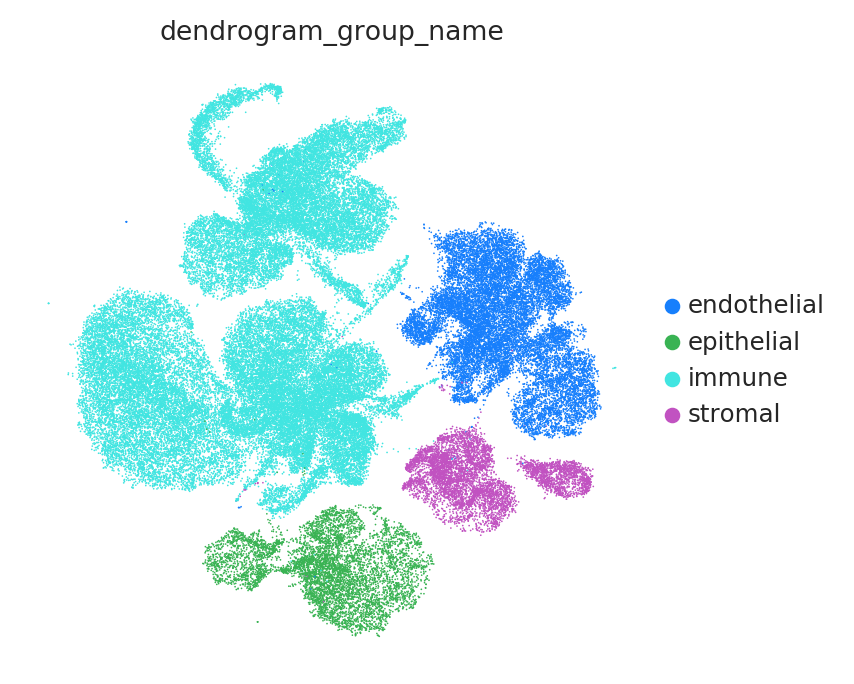

In [64]:
sc.pl.umap(
    adata,
    color="dendrogram_group_name",
    save="__dendrogram_group",
)

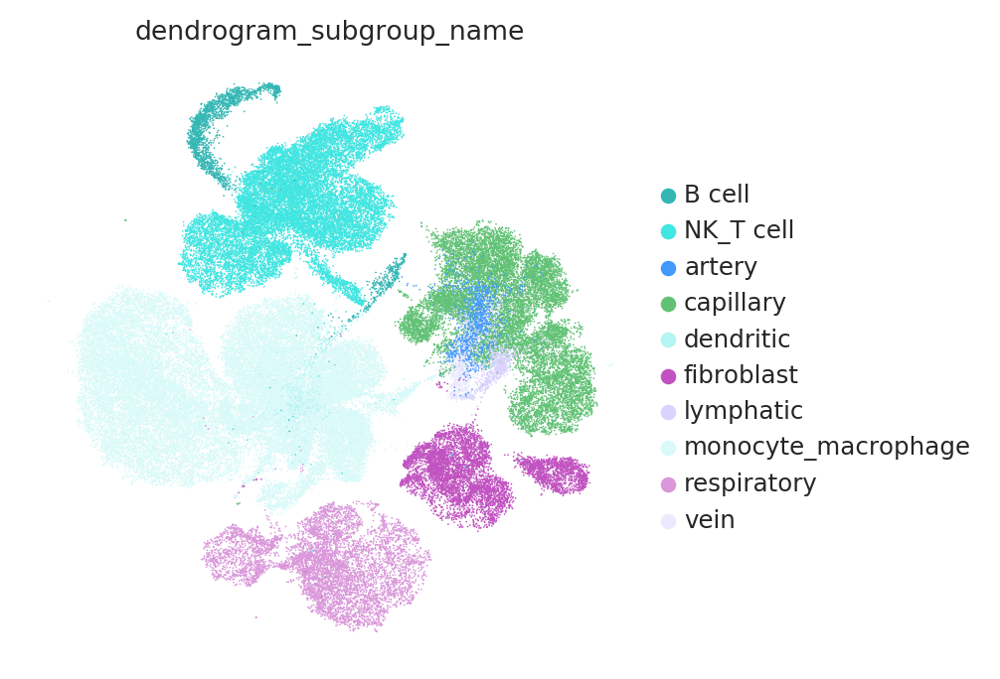

In [65]:
sc.pl.umap(
    adata,
    color="dendrogram_subgroup_name",
    save="__dendrogram_subgroup",
)

In [66]:
narrow_to_dendrogram_color = pd.Series(
    lemur_obs_colors[["narrow_group", "dendrogram_subgroup_color_hex"]]
    .set_index("narrow_group")["dendrogram_subgroup_color_hex"]
    .to_dict()
)
narrow_to_dendrogram_color

monocyte                           #d9d3fd
capillary cell                     #b3f5f3
alveolar macrophage                #d9d3fd
alveolar macrophage (PF)           #d9d3fd
T cell (CD4+)                      #da97da
natural killer cell                #da97da
plasma cell                        #c152c1
vein cell                          #41e5e1
alveolar fibroblast                #61c275
alveolar epithelial cell type 2    #4599fd
adventitial fibroblast             #61c275
capillary aerocyte cell            #b3f5f3
B cell                             #c152c1
T cell (CD8+)                      #da97da
lymphatic cell                     #d9faf9
conventional dendritic cell        #ece9fe
ciliated cell                      #4599fd
pericyte                           #61c275
natural killer cell_T cell (PF)    #da97da
natural killer T cell              #da97da
artery cell                        #34b7b4
plasmacytoid dendritic cell        #ece9fe
dtype: object

In [67]:
narrow_to_dendrogram_color = narrow_to_dendrogram_color.sort_index()
narrow_to_dendrogram_color

B cell                             #c152c1
T cell (CD4+)                      #da97da
T cell (CD8+)                      #da97da
adventitial fibroblast             #61c275
alveolar epithelial cell type 2    #4599fd
alveolar fibroblast                #61c275
alveolar macrophage                #d9d3fd
alveolar macrophage (PF)           #d9d3fd
artery cell                        #34b7b4
capillary aerocyte cell            #b3f5f3
capillary cell                     #b3f5f3
ciliated cell                      #4599fd
conventional dendritic cell        #ece9fe
lymphatic cell                     #d9faf9
monocyte                           #d9d3fd
natural killer T cell              #da97da
natural killer cell                #da97da
natural killer cell_T cell (PF)    #da97da
pericyte                           #61c275
plasma cell                        #c152c1
plasmacytoid dendritic cell        #ece9fe
vein cell                          #41e5e1
dtype: object

In [68]:
adata.uns.keys()

dict_keys(['hvg', 'pca', 'neighbors', 'umap', 'species_colors', 'species_batch_colors', 'dendrogram_group_name_colors', 'dendrogram_subgroup_name_colors'])

In [69]:
adata.obs["dendrogram_group"] = adata.obs["narrow_group"].copy()
adata.uns["dendrogram_group_colors"] = narrow_to_dendrogram_color.values.tolist()

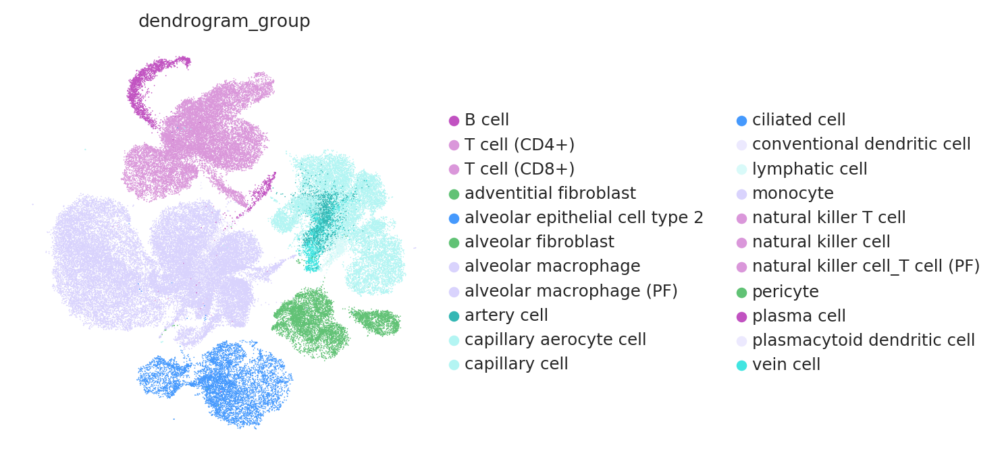

In [70]:
sc.pl.umap(
    adata,
    color="dendrogram_group",
    save="__narrow_group_dendrogram",
)

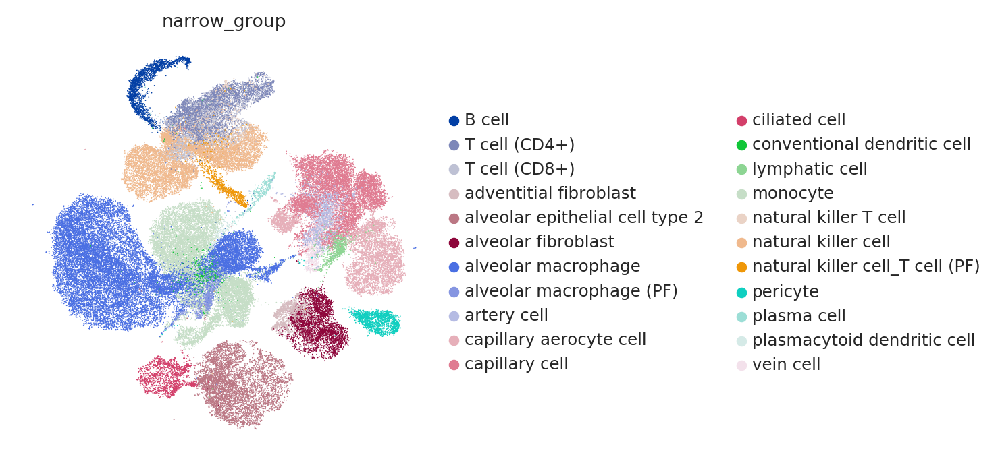

In [71]:
sc.pl.umap(adata, color="narrow_group", save="__narrow_group")

### Compartment group

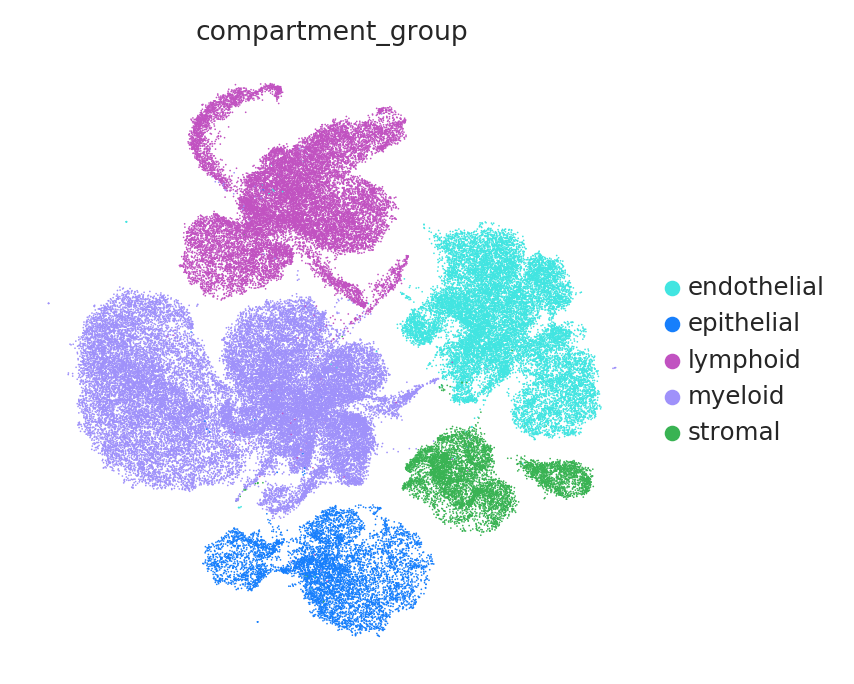

In [72]:
# there is some bug when the palette is pre-set
try:
    del adata.uns["compartment_group_colors"]
except KeyError:
    pass

sc.pl.umap(
    adata,
    color="compartment_group",
    save="__compartment_group",
    palette=plot_constants.compartment_to_color,
)

## Write output adata to file

In [73]:
# # Write BBKNN + UMAP data to file
adata.write(output_file)

In [74]:
output_file

'/home/olga/data_lg/data_sm_copy/tabula-microcebus/data-objects/cross-species/concatenated__human-lemur-mouse_10x__one2one_orthologs__lung__preprocessed.h5ad'

In [75]:
adata.obs.groupby(["narrow_group", "species"]).size()

narrow_group                     species    
B cell                           Mouse           1457
                                 Mouse Lemur      208
                                 Human            230
T cell (CD4+)                    Mouse            534
                                 Mouse Lemur     1029
                                 Human           2297
T cell (CD8+)                    Mouse            854
                                 Mouse Lemur      347
                                 Human           1942
adventitial fibroblast           Mouse            517
                                 Mouse Lemur      310
                                 Human            527
alveolar epithelial cell type 2  Mouse            122
                                 Mouse Lemur      948
                                 Human           4185
alveolar fibroblast              Mouse           1499
                                 Mouse Lemur      918
                                 Huma

## Write narrow group names for correlations

In [105]:
" ".join(
    [x.replace(" ", "\\") for x in sorted(set(adata.obs["narrow_group"]))]
).replace("(", "-openparen-").replace(')', '-closedparen-')

'B\\cell T\\cell\\-openparen-CD4+-closedparen- T\\cell\\-openparen-CD8+-closedparen- adventitial\\fibroblast alveolar\\epithelial\\cell\\type\\2 alveolar\\fibroblast alveolar\\macrophage alveolar\\macrophage\\-openparen-PF-closedparen- artery\\cell capillary\\aerocyte\\cell capillary\\cell ciliated\\cell conventional\\dendritic\\cell lymphatic\\cell monocyte natural\\killer\\T\\cell natural\\killer\\cell natural\\killer\\cell_T\\cell\\-openparen-PF-closedparen- pericyte plasma\\cell plasmacytoid\\dendritic\\cell vein\\cell'

# Plot correlations

## Append path to import

In [78]:
# sys.path.append('/home/olga/code/xspecies--olgabot/refactor-bladder-blood-lung-muscle/')

import visualize_correlation as corr_viz

-----
anndata     0.7.5
scanpy      1.7.0rc1
sinfo       0.3.1
-----
anndata             0.7.5
annoy               NA
attr                19.3.0
autoreload          NA
backcall            0.1.0
bbknn               NA
cairo               1.18.2
cffi                1.13.2
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.0
decorator           4.4.1
get_version         2.1
h5py                2.10.0
idna                2.8
igraph              0.7.1
importlib_metadata  0.19
ipykernel           5.1.3
ipython_genutils    0.2.0
jedi                0.15.1
jinja2              2.10.3
joblib              0.14.1
jsonschema          3.2.0
kiwisolver          1.1.0
legacy_api_wrap     0.0.0
leidenalg           0.7.0
llvmlite            0.30.0
louvain             0.6.1
markupsafe          1.1.1
matplotlib          3.1.2
more_itertools      NA
mpl_toolkits        NA
natsort             6.2.0
nbformat            4.4.0
numba               0.46.0
numexpr 

In [79]:
sorted(adata.obs.narrow_group.unique())

['B cell',
 'T cell (CD4+)',
 'T cell (CD8+)',
 'adventitial fibroblast',
 'alveolar epithelial cell type 2',
 'alveolar fibroblast',
 'alveolar macrophage',
 'alveolar macrophage (PF)',
 'artery cell',
 'capillary aerocyte cell',
 'capillary cell',
 'ciliated cell',
 'conventional dendritic cell',
 'lymphatic cell',
 'monocyte',
 'natural killer T cell',
 'natural killer cell',
 'natural killer cell_T cell (PF)',
 'pericyte',
 'plasma cell',
 'plasmacytoid dendritic cell',
 'vein cell']

In [80]:
{
    k: list(v)
    for k, v in adata.obs.groupby("compartment_group")
    .narrow_group.unique()
    .to_dict()
    .items()
}

{'endothelial': ['capillary cell',
  'capillary aerocyte cell',
  'vein cell',
  'artery cell',
  'lymphatic cell'],
 'epithelial': ['alveolar epithelial cell type 2', 'ciliated cell'],
 'lymphoid': ['B cell',
  'natural killer cell',
  'T cell (CD8+)',
  'natural killer T cell',
  'natural killer cell_T cell (PF)',
  'T cell (CD4+)',
  'plasma cell'],
 'myeloid': ['monocyte',
  'alveolar macrophage',
  'conventional dendritic cell',
  'alveolar macrophage (PF)',
  'plasmacytoid dendritic cell'],
 'stromal': ['adventitial fibroblast', 'alveolar fibroblast', 'pericyte']}

## Write yaml config

In [110]:
%%file config_lung.yml

all_groups:
   {"compartment": ['endothelial', 'epithelial', 'lymphoid', 'myeloid', 'stromal'],
    "broad": ['B cell',
 'T cell',
 'alveolar epithelial cell type 2',
 'artery cell',
 'capillary cell',
 'ciliated cell',
 'dendritic cell',
 'endothelial cell',
 'fibroblast',
 'lymphatic cell',
 'macrophage',
 'monocyte',
#  'myofibroblast cell',
 'natural killer T cell',
 'natural killer cell',
 'pericyte cell',
 'pericyte cell_smooth muscle cell',
 'plasma cell',
 'natural killer cell_T cell (PF)',
 'vein cell']
,
    "narrow": ['B cell',
 'T cell (CD4+)',
 'T cell (CD8+)',
 'adventitial fibroblast',
 'alveolar epithelial cell type 2',
 'alveolar fibroblast',
 'alveolar macrophage',
 'alveolar macrophage (PF)',
 'artery cell',
 'capillary aerocyte cell',
 'capillary cell',
 'ciliated cell',
 'conventional dendritic cell',
 'lymphatic cell',
 'monocyte',
 'natural killer T cell',
 'natural killer cell',
 'natural killer cell_T cell (PF)',
 'pericyte',
 'plasma cell',
 'plasmacytoid dendritic cell',
 'vein cell']
}
compartment_narrow: {'endothelial': ['capillary cell',
  'capillary aerocyte cell',
  'vein cell',
  'artery cell',
  'lymphatic cell'],
 'epithelial': ['alveolar epithelial cell type 2', 'ciliated cell'],
 'lymphoid': ['B cell',
  'natural killer cell',
  'CD8+ T cell',
  'natural killer T cell',
  'CD4+ T cell',
  'plasma cell',
  'proliferating natural killer cell_T cell'],
 'myeloid': ['monocyte',
  'alveolar macrophage',
  'conventional dendritic cell',
  'proliferating alveolar macrophage',
  'plasmacytoid dendritic cell'],
 'stromal': [
#      'myofibroblast cell',
  'adventitial fibroblast',
  'alveolar fibroblast',
  'pericyte cell']}
significant_compartment_narrow: {
    'endothelial': ['Capillary', 'Capillary Aerocyte', 'Lymphatic'],
    'epithelial': ['Alveolar Epithelial Type 2'],
    'lymphoid': ['CD4+ T', 'Natural Killer', 'Plasma', 'Proliferating NK/T'],
    'myeloid': [
        'Macrophage', 'Monocyte', 'Myeloid Dendritic', 'Proliferating Macrophage'],
    'stromal': ['Adventitial Fibroblast', 'Alveolar Fibroblast']}

Overwriting config_lung.yml


## Read YAML config

In [111]:
config_yaml_path = "config_lung.yml"


with open(config_yaml_path) as file:
    config = yaml.full_load(file)

groups = config["all_groups"].keys()

## Read dataframes

In [83]:
config["compartment_narrow"]

{'endothelial': ['capillary cell',
  'capillary aerocyte cell',
  'vein cell',
  'artery cell',
  'lymphatic cell'],
 'epithelial': ['alveolar epithelial cell type 2', 'ciliated cell'],
 'lymphoid': ['B cell',
  'natural killer cell',
  'CD8+ T cell',
  'natural killer T cell',
  'CD4+ T cell',
  'plasma cell',
  'proliferating natural killer cell_T cell'],
 'myeloid': ['monocyte',
  'alveolar macrophage',
  'conventional dendritic cell',
  'proliferating alveolar macrophage',
  'plasmacytoid dendritic cell'],
 'stromal': ['adventitial fibroblast', 'alveolar fibroblast', 'pericyte cell']}

In [84]:
groups

dict_keys(['compartment', 'broad', 'narrow'])

In [115]:
correl_dir = f"/home/olga/data_lg/data_sm_copy/tabula-microcebus/analyses/xi-correlation/"
within_celltypes_filenames = glob.glob(
    os.path.join(correl_dir, "lung__xi__narrow_group__drop_if_either_zero*.parquet")
)
print('\n'.join(map(os.path.basename, within_celltypes_filenames)))

lung__xi__narrow_group__drop_if_either_zero_capillary_cell.parquet
lung__xi__narrow_group__drop_if_either_zero_conventional_dendritic_cell.parquet
lung__xi__narrow_group__drop_if_either_zero_vein_cell.parquet
lung__xi__narrow_group__drop_if_either_zero_t_cell_(cd4+).parquet
lung__xi__narrow_group__drop_if_either_zero_plasma_cell.parquet
lung__xi__narrow_group__drop_if_either_zero_lymphatic_cell.parquet
lung__xi__narrow_group__drop_if_either_zero_natural_killer_t_cell.parquet
lung__xi__narrow_group__drop_if_either_zero_ciliated_cell.parquet
lung__xi__narrow_group__drop_if_either_zero_pericyte.parquet
lung__xi__narrow_group__drop_if_either_zero_monocyte.parquet
lung__xi__narrow_group__drop_if_either_zero_b_cell.parquet
lung__xi__narrow_group__drop_if_either_zero_alveolar_macrophage.parquet
lung__xi__narrow_group__drop_if_either_zero_natural_killer_cell_t_cell_(pf).parquet
lung__xi__narrow_group__drop_if_either_zero_adventitial_fibroblast.parquet
lung__xi__narrow_group__drop_if_either_zer

## Write parquet --> csv for backups

In [ ]:
for filename in within_celltypes_filenames:
    print(os.path.basename(filename))
    csv = filename.replace('.parquet', '.csv')
    print('--- Reading parquet ... ---')
    %time df = pd.read_parquet(filename)
    print('--- Writing csv ... ---')
    %time df.to_csv(csv)

## Read parquet files

In [116]:


dfs_within = defaultdict(list)
for filename in within_celltypes_filenames:
    for group in groups:
        if group in filename:
            df = pd.read_parquet(filename)
            df = df.rename(columns={group + "_group": "cell_ontology_class"})
            # Ignore dataframes with old "Mouse lemur" capitalization
            if 'Mouse lemur' in set(df.species1) or 'Mouse lemur' in set(df.species2):
                continue
            dfs_within[group].append(df)
len(dfs_within)

1

In [117]:
dfs_within.keys()

dict_keys(['narrow'])

In [118]:
narrow_correl = pd.concat(dfs_within["narrow"])
print(narrow_correl.shape)
narrow_correl.head()

(198000, 7)


,cell_ontology_class,species1,species2,iteration,xi,cell1,cell2
0,capillary cell,Mouse,Mouse,0,0.168779,AACCATGGTCTACCTC-1-53-0-0-0-mouse_tabula_muris...,AGTCTTTTCGCCTGAG-1-14-1-0-0-mouse_tabula_muris...
1,capillary cell,Mouse,Mouse Lemur,0,0.195875,AACCATGGTCTACCTC-1-53-0-0-0-mouse_tabula_muris...,L3_Lung_10X_CTGTGCTGTTTCGCTC-lemur
2,capillary cell,Mouse,Human,0,0.128926,AACCATGGTCTACCTC-1-53-0-0-0-mouse_tabula_muris...,P2_3_TGAGAGGTCAGAGACG-human_hlca
3,capillary cell,Mouse Lemur,Mouse,0,0.038894,L4_Lung_CD31_10X_ATGCGATTCAGTACGT-lemur,AGTCTTTTCGCCTGAG-1-14-1-0-0-mouse_tabula_muris...
4,capillary cell,Mouse Lemur,Mouse Lemur,0,0.201797,L4_Lung_CD31_10X_ATGCGATTCAGTACGT-lemur,L3_Lung_10X_CTGTGCTGTTTCGCTC-lemur


In [119]:
narrow_correl.shape

(198000, 7)

In [120]:
import seaborn as sns

In [121]:
mean_correl = narrow_correl.groupby(
    ["cell_ontology_class", "species1", "species2"]
).xi.mean()
mean_correl = mean_correl.reset_index()
mean_correl["species12"] = mean_correl.apply(
    lambda x: "--".join(sorted([x.species1, x.species2])), axis=1
)
mean_correl["species12"].unique()

array(['Human--Human', 'Human--Mouse', 'Human--Mouse Lemur',
       'Mouse--Mouse', 'Mouse--Mouse Lemur', 'Mouse Lemur--Mouse Lemur'],
      dtype=object)

In [122]:
mean_correl.pivot_table(index="cell_ontology_class", columns="species12", values="xi")

species12,Human--Human,Human--Mouse,Human--Mouse Lemur,Mouse Lemur--Mouse Lemur,Mouse--Mouse,Mouse--Mouse Lemur
cell_ontology_class,,,,,,
B cell,0.555697,0.477984,0.471217,0.537030,0.487156,0.470214
T cell (CD4+),0.434745,0.408201,0.392101,0.482201,0.471693,0.440995
T cell (CD8+),0.455805,0.427532,0.364792,0.408385,0.474329,0.390008
adventitial fibroblast,0.280022,0.238093,0.224848,0.256259,0.297801,0.228563
alveolar epithelial cell type 2,0.360519,0.297835,0.306003,0.351002,0.341229,0.293860
alveolar fibroblast,0.236219,0.186701,0.170905,0.215306,0.261072,0.171065
alveolar macrophage,0.350756,0.260093,0.284784,0.348886,0.331251,0.274436
alveolar macrophage (PF),0.327074,0.232573,0.240906,0.325715,0.315940,0.240327
artery cell,0.271693,0.232304,0.195560,0.227449,0.291498,0.195723


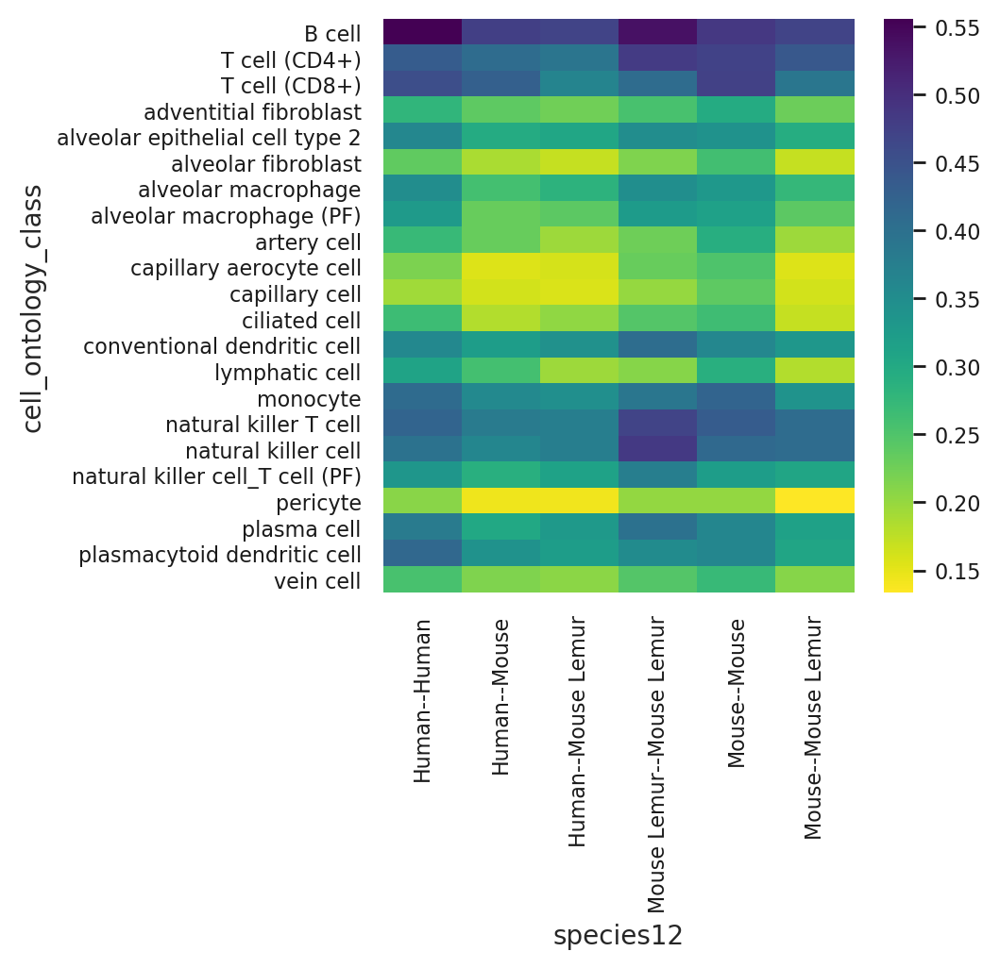

In [123]:
sns.heatmap(
    mean_correl.pivot_table(
        index="cell_ontology_class", columns="species12", values="xi"
    ),
    cmap="viridis_r",
)

## Visualize correlation

### Sset output folder

In [124]:
output_folder = "/home/olga/googledrive/TabulaMicrocebus/analysis/cross-species--bladder-blood-lung-muscle/lung/correlation"
! mkdir -p $output_folder

Matplotlib Backend: module://ipykernel.pylab.backend_inline
species2                                   Mouse  Mouse Lemur
species1 cell_ontology_class iteration                       
Human    B cell              0          0.437595     0.474385
                             1          0.467827     0.351360
                             2          0.506200     0.467064
                             3          0.448017     0.482904
                             4          0.503634     0.519362


/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing 

--- means: ---
compartment_narrow,"xi(Human, mouse) - xi(Human, lemur)"
endothelial: artery cell,0.00801681518733816
endothelial: capillary aerocyte cell,-0.025959862332035406
endothelial: capillary cell,-0.01187403290272927
endothelial: lymphatic cell,0.04495467849760487
endothelial: vein cell,-0.0031070620029581236
epithelial: alveolar epithelial cell type 2,-0.007091606246754656
epithelial: ciliated cell,-0.041605013647600324
lymphoid: B cell,-0.013382789701164641
lymphoid: T cell (CD4+),-0.006889265127214943
lymphoid: T cell (CD8+),0.029496336326849937
lymphoid: natural killer T cell,-0.004821738422770273
lymphoid: natural killer cell,-0.023376724188349143
lymphoid: natural killer cell_T cell (PF),-0.04570189393242517
lymphoid: pericyte,-0.013235935915489588
lymphoid: plasma cell,-0.04927574435693457
myeloid: alveolar macrophage,-0.01551340228091064
myeloid: alveolar macrophage (PF),0.011093560636994891
myeloid: conventional dendritic cell,-0.036920567350988066
myeloid: monocyte,-0

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing 

--- means: ---
compartment_narrow,"xi(Mouse Lemur, mouse) - xi(Mouse Lemur, human)"
endothelial: artery cell,-0.008062866652639986
endothelial: capillary aerocyte cell,-0.022822869803308214
endothelial: capillary cell,-0.005959258511679439
endothelial: lymphatic cell,-0.01049670964863965
endothelial: vein cell,-0.006238990505416648
epithelial: alveolar epithelial cell type 2,-0.01766368728473586
epithelial: ciliated cell,-0.024921597818882202
lymphoid: B cell,-0.01861949900953943
lymphoid: T cell (CD4+),0.029728272306911264
lymphoid: T cell (CD8+),-1.0555500717660537e-05
lymphoid: natural killer T cell,0.017129818075138293
lymphoid: natural killer cell,0.0015956315955839276
lymphoid: natural killer cell_T cell (PF),-0.030463594867697195
lymphoid: pericyte,-0.01719209609740555
lymphoid: plasma cell,-0.023352437881270904
myeloid: alveolar macrophage,0.013346164917985674
myeloid: alveolar macrophage (PF),0.025467497660304112
myeloid: conventional dendritic cell,-0.017713303597674413
myelo

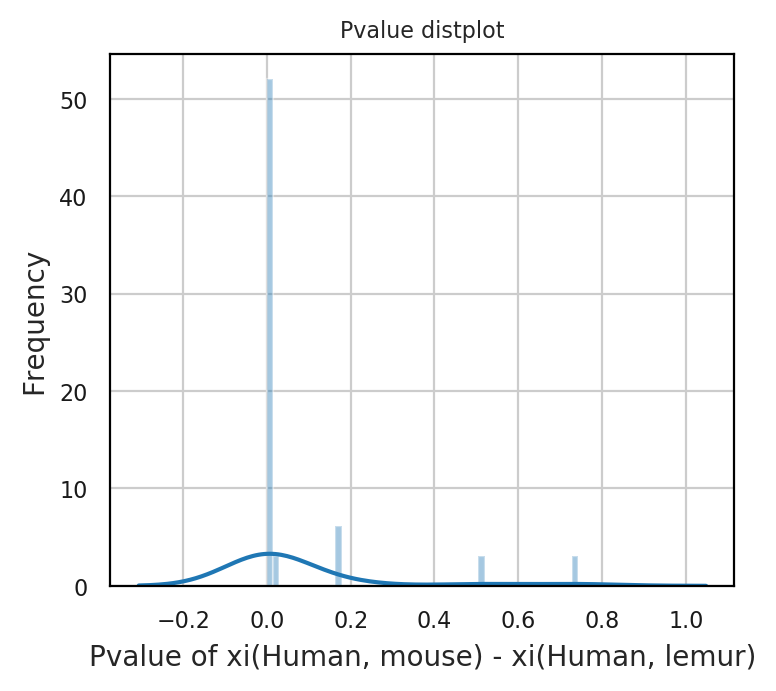

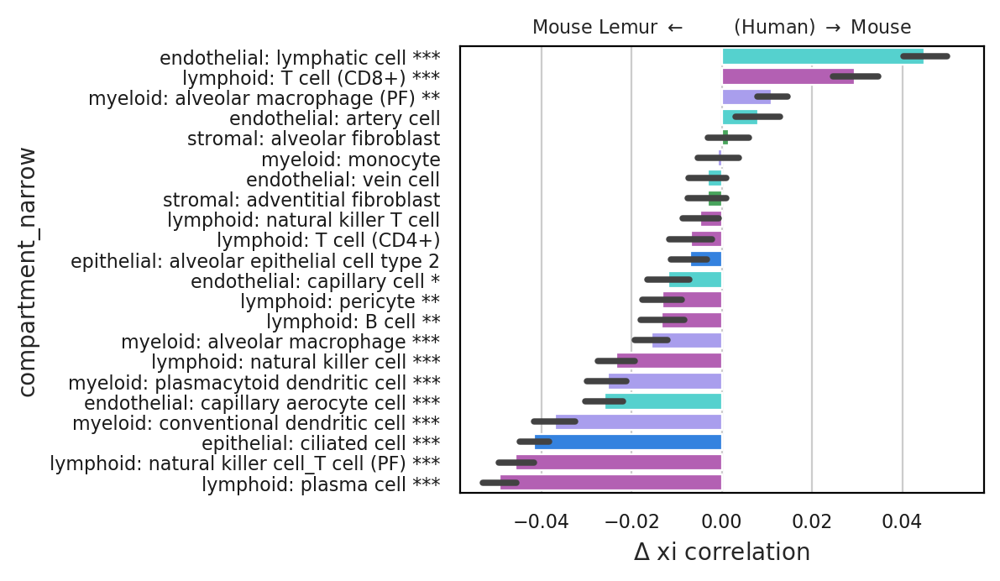

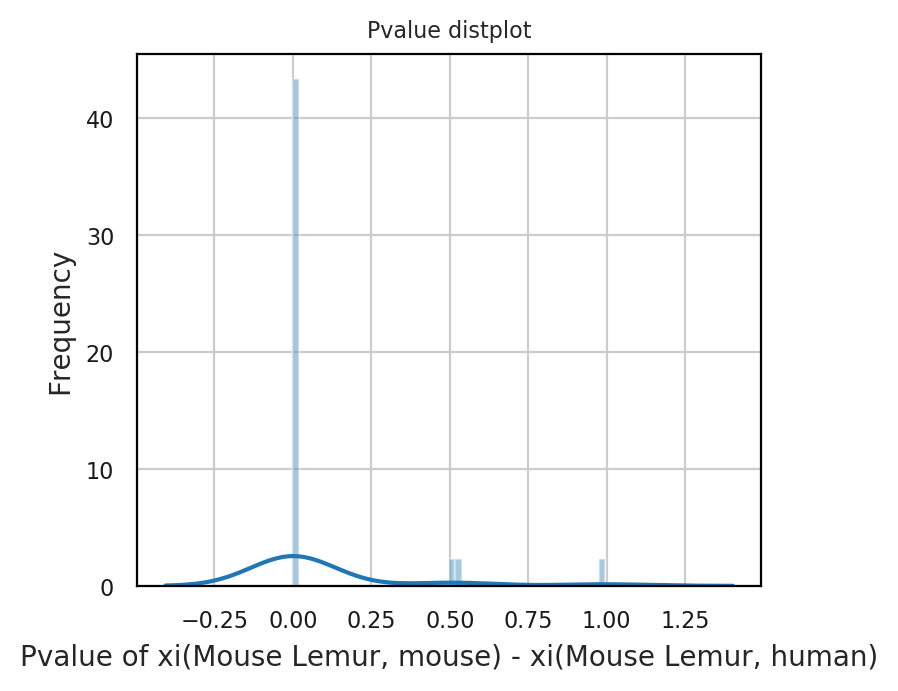

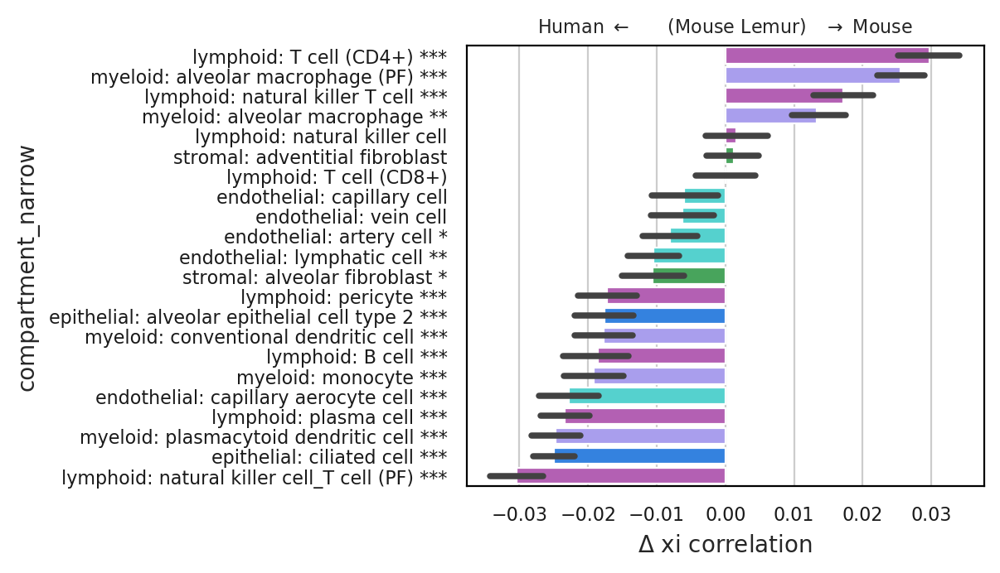

In [127]:
from matplotlib import rc

rc("font", **{"family": "sans-serif", "sans-serif": ["Arial"]})
# rc('font',**{'family':'serif','serif':['Times']})
rc("text", usetex=False)

pvalue_level_kws = dict(level3=1e-10, level2=1e-5, level1=1e-2)

for key, dictionary in config.items():
    if "all_groups" == key:
        continue
    if "significant" in key:
        continue
    #         df = pd.concat(dfs_within["narrow"], ignore_index=True)
    #         narrow_celltypes_significant = []
    #         for key, value in config["significant_compartment_narrow"].items():
    #             narrow_celltypes_significant.extend(value)
    #         df = df[df['cell_ontology_class'].isin(
    #             narrow_celltypes_significant)]
    else:
        df = pd.concat(dfs_within["narrow"], ignore_index=True)
    corr_viz.corr_diff_within(
        df, "Human", dictionary, pvalue_level_kws=pvalue_level_kws
    )
    corr_viz.corr_diff_within(
        df, "Mouse Lemur", dictionary, pvalue_level_kws=pvalue_level_kws
    )


for i in plt.get_fignums():
    fig = plt.figure(i)
    fig.set_size_inches(4, 3.5)
    #     fig.tight_layout()
    fig.savefig(os.path.join(output_folder, "figure%d.png" % i))
    fig.savefig(os.path.join(output_folder, "figure%d.pdf" % i))